In [1]:
import pandas as pd #data manpulation
import numpy as np
import matplotlib.pyplot as plt #data visualization
import seaborn as sns
import scipy

# 1) Cleaning + EDA + Standarization + Encoding 
import chardet #to detetmine dataset encoding

from sklearn.preprocessing import StandardScaler # scaling data so mean = 0 and std =  1 by ((x- u) / std)
from scipy import stats # for Box-Cox Transformation stats.boxcox(original_data)[0]
from mlxtend.preprocessing import minmax_scaling # for min_max scaling dont use it
#or
from sklearn.preprocessing import MinMaxScaler,normalize  #Tune input range to be 0 -> 1 by MinMaxScaler, same as above

#preprocessing: replace numeric and categorical
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import LabelEncoder # label (ordinal or nominal)
from sklearn.preprocessing import OrdinalEncoder # object (no order)
from sklearn.preprocessing import OneHotEncoder # categorical 

# 2) feature enginerring
from sklearn.feature_selection import mutual_info_regression #mutal importance of feature
# a) numeric feature enginering
from sklearn.cluster import KMeans # Kmeans model for cluster feature
from IPython.display import display
from sklearn.decomposition import PCA # for loadings and adding new feature
# b) categorical feature enginering
from category_encoders import MEstimateEncoder # have m estimator


# 3) Data Modeling = train test split then model then get error
from sklearn.model_selection import train_test_split #also has cross_val_score (cv)
from sklearn.model_selection import RepeatedKFold # k fold cross validation it specify cv in corss_val_score dw
from sklearn.model_selection import cross_val_score # cv to get mean and see how much this feature affect the MAE error
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBRegressor 
from xgboost import XGBClassifier
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score # accuracy of classification
#for accurace of regression use model.score or cross_val_score

#pipeline
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer

# 4) Model summary = features importance and effect + sharp values
import eli5
from eli5.sklearn import PermutationImportance # feature importance
# from pdpbox import pdp, get_dataset, info_plots #for pdp plots
import shap  # package used to calculate Shap values
import time

C:\Users\ahmed\.conda\envs\machine_learning\lib\site-packages\requests\__init__.py:102: RequestsDependencyWarning: urllib3 (1.26.9) or chardet (5.0.0)/charset_normalizer (2.0.12) doesn't match a supported version!
  warnings.warn("urllib3 ({}) or chardet ({})/charset_normalizer ({}) doesn't match a supported "


# 1) Starting with Data
* understand features & see data
* check dtypes
* Errors -> NaN
* summary

In [2]:
# know encoding of file
file = open("data_pc_2.csv", 'rb')
result = chardet.detect(file.read(10000))
print(result)

{'encoding': 'utf-8', 'confidence': 0.99, 'language': ''}


In [3]:
df = pd.read_csv('data_pc_2.csv', encoding=result['encoding'])
df

,name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Time_signature
0,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,67.0,0.03110,0.904,0.813,0.006970,0.0471,-7.105,0.1210,125.461,4.0
1,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,81.0,0.02490,0.774,0.838,0.025000,0.2420,-3.914,0.1140,143.040,4.0
2,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,21.0,0.00238,0.664,0.758,0.000000,0.0598,-6.583,0.2100,99.259,4.0
3,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,76.0,0.20100,0.892,0.714,0.000234,0.0521,-6.055,0.1410,100.972,4.0
4,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.0,0.05610,0.853,0.606,0.000000,0.3130,-4.596,0.0713,94.759,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,3999,1420848000,97,56,1,9,22548683,17,...,58.0,0.02230,0.380,0.538,0.004870,0.0940,-5.493,0.0313,127.416,4.0
266382,other,False,3999,1420848000,97,56,1,9,22548683,17,...,61.0,0.00415,0.401,0.706,0.000000,0.0916,-7.554,0.0404,168.669,4.0
266383,other,False,3999,1420848000,97,56,1,9,22548683,17,...,58.0,0.00192,0.513,0.820,0.000003,0.5040,-5.428,0.0299,99.952,4.0
266384,other,False,3999,1420848000,97,56,1,9,22548683,17,...,0.0,0.01310,0.381,0.844,0.000000,0.3180,-7.123,0.1440,194.000,4.0


In [4]:
# understood all features

df.columns # name -> playlist
# Name & track_name
# Album & album_name
# Artist & artist_name
# Length & track_duration_ms

Index(['name', 'collaborative', 'pid', 'modified_at', 'num_tracks',
       'num_albums', 'num_followers', 'num_edits', 'playlist_duration_ms',
       'num_artists', 'description', 'pos', 'artist_name', 'track_uri',
       'artist_uri', 'track_name', 'album_uri', 'track_duration_ms',
       'album_name', 'Name', 'Album', 'Artist', 'Release_date', 'Length',
       'Popularity', 'Acousticness', 'Danceability', 'Energy',
       'Instrumentalness', 'Liveness', 'Loudness', 'Speechiness', 'Tempo',
       'Time_signature'],
      dtype='object')

In [5]:
df[['Name', 'track_name']] #old data is diffrent from features extracted using spotify

,Name,track_name
0,Lose Control (feat. Ciara & Fat Man Scoop),Lose Control (feat. Ciara & Fat Man Scoop)
1,Toxic,Toxic
2,Crazy In Love (feat. Jay-Z),Crazy In Love
3,Rock Your Body,Rock Your Body
4,It Wasn't Me,It Wasn't Me
...,...,...
266381,Uninvited,Uninvited
266382,You Learn - 2015 Remaster,You Learn - 2015 Remastered
266383,Hands Clean,Hands Clean
266384,Cecilia And The Satellite,Cecilia And The Satellite


In [6]:
# check dtypes
df.info()
# correct dtypes
# all are good except Release_date (should be DateTime) have value '0000' so replaced to NaN correct then convert its dtype &
# Populartiy (should be int64 but it have NaN thats why its float64 after correcting will change it dtype)
# Length have NaNs so corrected then change its dtype

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 266386 entries, 0 to 266385
Data columns (total 34 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   name                  266386 non-null  object 
 1   collaborative         266386 non-null  bool   
 2   pid                   266386 non-null  int64  
 3   modified_at           266386 non-null  int64  
 4   num_tracks            266386 non-null  int64  
 5   num_albums            266386 non-null  int64  
 6   num_followers         266386 non-null  int64  
 7   num_edits             266386 non-null  int64  
 8   playlist_duration_ms  266386 non-null  int64  
 9   num_artists           266386 non-null  int64  
 10  description           5333 non-null    object 
 11  pos                   266386 non-null  int64  
 12  artist_name           266386 non-null  object 
 13  track_uri             266386 non-null  object 
 14  artist_uri            266386 non-null  object 
 15  

In [7]:
df.iloc[:, -15:] #explore data

,Name,Album,Artist,Release_date,Length,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Time_signature
0,Lose Control (feat. Ciara & Fat Man Scoop),The Cookbook,Missy Elliott,2005-07-04,226863.0,67.0,0.03110,0.904,0.813,0.006970,0.0471,-7.105,0.1210,125.461,4.0
1,Toxic,In The Zone,Britney Spears,2003-11-13,198800.0,81.0,0.02490,0.774,0.838,0.025000,0.2420,-3.914,0.1140,143.040,4.0
2,Crazy In Love (feat. Jay-Z),Dangerously In Love (Alben für die Ewigkeit),Beyoncé,2003-06-23,235933.0,21.0,0.00238,0.664,0.758,0.000000,0.0598,-6.583,0.2100,99.259,4.0
3,Rock Your Body,Justified,Justin Timberlake,2002-11-04,267266.0,76.0,0.20100,0.892,0.714,0.000234,0.0521,-6.055,0.1410,100.972,4.0
4,It Wasn't Me,Hot Shot (International Version #2),Shaggy,2000,227600.0,0.0,0.05610,0.853,0.606,0.000000,0.3130,-4.596,0.0713,94.759,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,Uninvited,The Collection (Standard Edition),Alanis Morissette,2005-11-11,276200.0,58.0,0.02230,0.380,0.538,0.004870,0.0940,-5.493,0.0313,127.416,4.0
266382,You Learn - 2015 Remaster,Jagged Little Pill (2015 Remaster),Alanis Morissette,1995,239640.0,61.0,0.00415,0.401,0.706,0.000000,0.0916,-7.554,0.0404,168.669,4.0
266383,Hands Clean,Under Rug Swept,Alanis Morissette,2002-02-25,269400.0,58.0,0.00192,0.513,0.820,0.000003,0.5040,-5.428,0.0299,99.952,4.0
266384,Cecilia And The Satellite,Andrew McMahon In The Wilderness,Andrew McMahon in the Wilderness,2014-10-13,223879.0,0.0,0.01310,0.381,0.844,0.000000,0.3180,-7.123,0.1440,194.000,4.0


In [8]:
# Errors -> NaN
columns = df.columns # describtion should have strip in data inconsistency also years have 0000 should be NaN
for col in columns:
    print(col, ": ",df[col].unique())
    print()

name :  ['Throwbacks' 'Awesome Playlist' 'korean ' ... 'Miles' 'Mellow Mood'
 'mix up']

collaborative :  [False  True]

pid :  [   0    1    2 ... 3997 3998 3999]

modified_at :  [1493424000 1506556800 1505692800 ... 1427673600 1365033600 1420848000]

num_tracks :  [ 52  39  64 126  17  80  16  53  46  21  72 134   9  13 103   7 105  79
  68  85  14  15  42  20  41  26  12  81  40 157  97 106  70  58 209 158
  33  76  11  32  45  55  54   5 151  19  38 136  66 133   8 174  18  74
 197  34  24  25  69  92  98 124 170 233  22  48 177  65 115 114  62 132
  23 194 168 245 176  50  94 205  99  10 130  44  71 109  37  60 198 141
  89  29 188 102 161  61  95  27 171 121  57  47  49  90 123 146 148  30
 120 111 229  43  67  31  28  96  78  88 145  35 179  59 108  73  83  51
  56   6  63 101 135 143 118 167 202  75 236 128 122  82 152 129 210 214
 228  87 169 189 113  84 100 199 203 195 166  77 159 240 140 173 142 139
 175 241  36 218 127 137 215 149 238 178 138 192 191 154 147 104 155 110
 16

track_name :  ['Lose Control (feat. Ciara & Fat Man Scoop)' 'Toxic' 'Crazy In Love' ...
 'Living In The Moment' 'Pictures Of You - Remix'
 'Close To Me - Closest Mix']

album_uri :  ['spotify:album:6vV5UrXcfyQD1wu4Qo2I9K'
 'spotify:album:0z7pVBGOD7HCIB7S8eLkLI'
 'spotify:album:25hVFAxTlDvXbx2X2QkUkE' ...
 'spotify:album:6qkjbSkKmSUwek48wWUBZG'
 'spotify:album:3jRLyc2t1tExfVpdB88EUm'
 'spotify:album:7atCFN41kB5N0zivS2Pwtd']

track_duration_ms :  [226863 198800 235933 ... 224365 178068 182569]

album_name :  ['The Cookbook' 'In The Zone'
 'Dangerously In Love (Alben für die Ewigkeit)' ...
 'Mind Of A Menace 3 Reloaded' 'Galore - The Singles 1987-1997' 'Mixed Up']

Name :  ['Lose Control (feat. Ciara & Fat Man Scoop)' 'Toxic'
 'Crazy In Love (feat. Jay-Z)' ... 'Living in the Moment'
 'Pictures Of You - Remix' 'Close to Me - Closest Mix']

Album :  ['The Cookbook' 'In The Zone'
 'Dangerously In Love (Alben für die Ewigkeit)' ...
 'Mind of a Menace 3 (Reloaded)' 'Galore - The Singles 1987-1

In [9]:
df.iloc[6240, :] # 0000, 0 means NaN

name                                                    latin
collaborative                                           False
pid                                                       103
modified_at                                        1508544000
num_tracks                                                177
num_albums                                                133
num_followers                                               1
num_edits                                                  28
playlist_duration_ms                                 43921538
num_artists                                                63
description                                               NaN
pos                                                        48
artist_name                                 Cultura Profética
track_uri                              69q6JHLOPBZaypN9aExRsa
artist_uri              spotify:artist:65HuWBUC1d8ty1q6J42Nfi
track_name                                           Protesto
album_ur

In [10]:
df['Release_date'] = df['Release_date'].replace('0000', np.nan)
df['Release_date'] = df['Release_date'].replace('0', np.nan)

df['Release_date'][6240]

nan

In [11]:
# summary
df.describe()

,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,pos,track_duration_ms,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Time_signature
count,266386.000000,2.663860e+05,266386.000000,266386.000000,266386.000000,266386.000000,2.663860e+05,266386.000000,266386.000000,2.663860e+05,...,266378.000000,266378.000000,266378.000000,266378.000000,266378.000000,266378.000000,266378.000000,266378.000000,266378.000000,266378.000000
mean,1993.841182,1.481416e+09,109.696118,78.485273,2.587058,28.414714,2.569005e+07,58.080781,54.348059,2.341668e+05,...,35.690125,0.230163,0.605974,0.647242,0.054497,0.189532,-7.205637,0.093167,121.657421,3.944474
std,1154.302420,3.413926e+07,62.854489,47.731695,41.220510,28.720508,1.508847e+07,36.989759,48.162079,7.358286e+04,...,28.995444,0.273576,0.159522,0.208400,0.183952,0.155606,3.573762,0.099511,28.768129,0.336038
min,0.000000,1.322611e+09,5.000000,2.000000,1.000000,2.000000,9.238790e+05,3.000000,0.000000,0.000000e+00,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-60.000000,0.000000,0.000000,0.000000
25%,986.000000,1.466467e+09,57.000000,40.000000,1.000000,7.000000,1.310109e+07,30.000000,17.000000,1.982930e+05,...,0.000000,0.020800,0.501000,0.514000,0.000000,0.094400,-8.627000,0.035600,99.515000,4.000000
50%,1982.000000,1.495843e+09,100.000000,71.000000,1.000000,18.000000,2.330853e+07,51.000000,40.000000,2.248660e+05,...,40.000000,0.104000,0.614000,0.676000,0.000003,0.126000,-6.453000,0.050100,120.518500,4.000000
75%,2998.000000,1.506989e+09,157.000000,110.000000,2.000000,39.000000,3.621352e+07,78.000000,79.000000,2.586260e+05,...,62.000000,0.357000,0.721000,0.811000,0.000732,0.241000,-4.879000,0.101000,139.995000,4.000000
max,3999.000000,1.509494e+09,248.000000,233.000000,2699.000000,178.000000,7.997390e+07,199.000000,247.000000,5.279768e+06,...,92.000000,0.996000,0.991000,1.000000,0.999000,1.000000,2.766000,0.962000,232.080000,5.000000


# 2) Cleaning
Train Valid split
* NaN handling
* Duplicates
* Outliers
* Data inconsistency (strip all categorical features)

In [12]:
# 1) NaN handling
df.isnull().sum() # NaNs in features Extracted
# description (lets see feature extraced and description droped (261K/266K = 98% NaN) ) so drop it

name                         0
collaborative                0
pid                          0
modified_at                  0
num_tracks                   0
num_albums                   0
num_followers                0
num_edits                    0
playlist_duration_ms         0
num_artists                  0
description             261053
pos                          0
artist_name                  0
track_uri                    0
artist_uri                   0
track_name                   0
album_uri                    0
track_duration_ms            0
album_name                   0
Name                        50
Album                       50
Artist                       8
Release_date                88
Length                       8
Popularity                   8
Acousticness                 8
Danceability                 8
Energy                       8
Instrumentalness             8
Liveness                     8
Loudness                     8
Speechiness                  8
Tempo   

In [13]:
df = df.drop('description', axis=1)
df

,name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Time_signature
0,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,67.0,0.03110,0.904,0.813,0.006970,0.0471,-7.105,0.1210,125.461,4.0
1,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,81.0,0.02490,0.774,0.838,0.025000,0.2420,-3.914,0.1140,143.040,4.0
2,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,21.0,0.00238,0.664,0.758,0.000000,0.0598,-6.583,0.2100,99.259,4.0
3,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,76.0,0.20100,0.892,0.714,0.000234,0.0521,-6.055,0.1410,100.972,4.0
4,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.0,0.05610,0.853,0.606,0.000000,0.3130,-4.596,0.0713,94.759,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,3999,1420848000,97,56,1,9,22548683,17,...,58.0,0.02230,0.380,0.538,0.004870,0.0940,-5.493,0.0313,127.416,4.0
266382,other,False,3999,1420848000,97,56,1,9,22548683,17,...,61.0,0.00415,0.401,0.706,0.000000,0.0916,-7.554,0.0404,168.669,4.0
266383,other,False,3999,1420848000,97,56,1,9,22548683,17,...,58.0,0.00192,0.513,0.820,0.000003,0.5040,-5.428,0.0299,99.952,4.0
266384,other,False,3999,1420848000,97,56,1,9,22548683,17,...,0.0,0.01310,0.381,0.844,0.000000,0.3180,-7.123,0.1440,194.000,4.0


In [14]:
indices = df[df.isnull()['Name']].index
df.loc[indices, ['Name', 'track_name', 'Popularity', 'Energy', 'Tempo']] # spotify returned data for 50 tracks analysis is still
# exsisting but track details and song is removed at all so must be droped (50 song removed from 266K songs)

,Name,track_name,Popularity,Energy,Tempo
6240,NaN,Protesto,0.0,0.41900,131.053
8125,NaN,Boom Bye Bye,0.0,0.69700,153.815
11358,NaN,Boom Bye Bye,0.0,0.69700,153.815
17460,NaN,El Amor De Su Vida,0.0,0.60600,100.022
17509,NaN,Eso Si Me Dolió,0.0,0.61700,122.586
17510,NaN,Pongámonos De Acuerdo,0.0,0.52100,97.545
33255,NaN,Palenque Palenque,NaN,NaN,NaN
35398,NaN,Force,0.0,0.54400,105.014
35400,NaN,Spectre,0.0,0.75800,127.946
42207,NaN,GXD,0.0,0.52500,103.985


In [15]:
df = df.drop(indices, axis=0)
df

,name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Time_signature
0,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,67.0,0.03110,0.904,0.813,0.006970,0.0471,-7.105,0.1210,125.461,4.0
1,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,81.0,0.02490,0.774,0.838,0.025000,0.2420,-3.914,0.1140,143.040,4.0
2,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,21.0,0.00238,0.664,0.758,0.000000,0.0598,-6.583,0.2100,99.259,4.0
3,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,76.0,0.20100,0.892,0.714,0.000234,0.0521,-6.055,0.1410,100.972,4.0
4,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.0,0.05610,0.853,0.606,0.000000,0.3130,-4.596,0.0713,94.759,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,3999,1420848000,97,56,1,9,22548683,17,...,58.0,0.02230,0.380,0.538,0.004870,0.0940,-5.493,0.0313,127.416,4.0
266382,other,False,3999,1420848000,97,56,1,9,22548683,17,...,61.0,0.00415,0.401,0.706,0.000000,0.0916,-7.554,0.0404,168.669,4.0
266383,other,False,3999,1420848000,97,56,1,9,22548683,17,...,58.0,0.00192,0.513,0.820,0.000003,0.5040,-5.428,0.0299,99.952,4.0
266384,other,False,3999,1420848000,97,56,1,9,22548683,17,...,0.0,0.01310,0.381,0.844,0.000000,0.3180,-7.123,0.1440,194.000,4.0


In [16]:
indices = df[df.isnull()['Release_date']].index
df.loc[indices, ['Name', 'track_name', 'Popularity', 'Energy', 'Tempo']] # No Data so remove it

,Name,track_name,Popularity,Energy,Tempo
70400,0,Like The Rain,0.0,0.0,0.0
70401,0,Letters From Home,0.0,0.0,0.0
95600,0,The Hills,0.0,0.0,0.0
95601,0,Hotline Bling,0.0,0.0,0.0
95602,0,Back To Back,0.0,0.0,0.0
95603,0,Bitches N Marijuana,0.0,0.0,0.0
95604,0,679 (feat. Remy Boyz),0.0,0.0,0.0
95605,0,Medusa (feat. Ward 21),0.0,0.0,0.0
95606,0,White Crime,0.0,0.0,0.0
95607,0,I Like Tuh,0.0,0.0,0.0


In [17]:
df = df.drop(indices, axis=0)
df

,name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Time_signature
0,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,67.0,0.03110,0.904,0.813,0.006970,0.0471,-7.105,0.1210,125.461,4.0
1,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,81.0,0.02490,0.774,0.838,0.025000,0.2420,-3.914,0.1140,143.040,4.0
2,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,21.0,0.00238,0.664,0.758,0.000000,0.0598,-6.583,0.2100,99.259,4.0
3,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,76.0,0.20100,0.892,0.714,0.000234,0.0521,-6.055,0.1410,100.972,4.0
4,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.0,0.05610,0.853,0.606,0.000000,0.3130,-4.596,0.0713,94.759,4.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,3999,1420848000,97,56,1,9,22548683,17,...,58.0,0.02230,0.380,0.538,0.004870,0.0940,-5.493,0.0313,127.416,4.0
266382,other,False,3999,1420848000,97,56,1,9,22548683,17,...,61.0,0.00415,0.401,0.706,0.000000,0.0916,-7.554,0.0404,168.669,4.0
266383,other,False,3999,1420848000,97,56,1,9,22548683,17,...,58.0,0.00192,0.513,0.820,0.000003,0.5040,-5.428,0.0299,99.952,4.0
266384,other,False,3999,1420848000,97,56,1,9,22548683,17,...,0.0,0.01310,0.381,0.844,0.000000,0.3180,-7.123,0.1440,194.000,4.0


In [18]:
df.isnull().sum().sum()

0

In [19]:
# Now we can change dtype of popularity and lengths and release date
df['Popularity'] = df['Popularity'].astype('int64')
df['Length'] = df['Length'].astype('int64')

df['Popularity'].dtype, df['Length'].dtype

(dtype('int64'), dtype('int64'))

In [20]:
# df['parsed_Release_date'] = 0
# df['parsed_Release_date'][6000:6200] = pd.to_datetime(df['Release_date'][6000:6200], infer_datetime_format=True)

In [21]:
df['parsed_Release_date'] = pd.to_datetime(df['Release_date'], infer_datetime_format=True)
df['parsed_Release_date'].dtype, df['Release_date'].dtype

(dtype('<M8[ns]'), dtype('O'))

In [22]:
df = df.drop('Release_date', axis=1) # drop old date
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 266298 entries, 0 to 266385
Data columns (total 33 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   name                  266298 non-null  object        
 1   collaborative         266298 non-null  bool          
 2   pid                   266298 non-null  int64         
 3   modified_at           266298 non-null  int64         
 4   num_tracks            266298 non-null  int64         
 5   num_albums            266298 non-null  int64         
 6   num_followers         266298 non-null  int64         
 7   num_edits             266298 non-null  int64         
 8   playlist_duration_ms  266298 non-null  int64         
 9   num_artists           266298 non-null  int64         
 10  pos                   266298 non-null  int64         
 11  artist_name           266298 non-null  object        
 12  track_uri             266298 non-null  object        
 13 

In [23]:
columns = df.columns # populatrity still have 0
for col in columns:
    print(col, ": ",df[col].unique())
    print()

name :  ['Throwbacks' 'Awesome Playlist' 'korean ' ... 'Miles' 'Mellow Mood'
 'mix up']

collaborative :  [False  True]

pid :  [   0    1    2 ... 3997 3998 3999]

modified_at :  [1493424000 1506556800 1505692800 ... 1427673600 1365033600 1420848000]

num_tracks :  [ 52  39  64 126  17  80  16  53  46  21  72 134   9  13 103   7 105  79
  68  85  14  15  42  20  41  26  12  81  40 157  97 106  70  58 209 158
  33  76  11  32  45  55  54   5 151  19  38 136  66 133   8 174  18  74
 197  34  24  25  69  92  98 124 170 233  22  48 177  65 115 114  62 132
  23 194 168 245 176  50  94 205  99  10 130  44  71 109  37  60 198 141
  89  29 188 102 161  61  95  27 171 121  57  47  49  90 123 146 148  30
 120 111 229  43  67  31  28  96  78  88 145  35 179  59 108  73  83  51
  56   6  63 101 135 143 118 167 202  75 236 128 122  82 152 129 210 214
 228  87 169 189 113  84 100 199 203 195 166  77 159 240 140 173 142 139
 175 241  36 218 127 137 215 149 238 178 138 192 191 154 147 104 155 110
 16

In [24]:
df.groupby(['Popularity', 'Time_signature']).apply(lambda df: df.loc[df.Energy.idxmax()]) # popularity 0 have meaning idk how

name  collaborative   pid  modified_at  \
Popularity Time_signature                                                     
0          0.0                 Halloween           False  3187   1468195200   
           1.0                       Punk          False  3050   1500163200   
           3.0                     Heavy           False  2093   1509148800   
           4.0                    Workout          False  3471   1453766400   
           5.0                       Rock          False  1339   1489449600   
...                                   ...            ...   ...          ...   
88         4.0                       vibe          False  1544   1509148800   
89         4.0                      relax          False    94   1495324800   
90         3.0             elevator music          False   475   1506556800   
91         4.0                        Pop          False   152   1424908800   
92         4.0                        80s          False  3896   1414022400   

                           num_tracks  num_albums  num_followers  num_edits  \
Popularity Time_signature                                                     
0          0.0                    105          55              1          2   
           1.0                    146          91              1         30   
           3.0                    170          67              1        107   
           4.0                     52          32              2          4   
           5.0                    217          43              1         17   
...                               ...         ...            ...        ...   
88         4.0                     40          31              6         19   
89         4.0                    124         112              1         35   
90         3.0                    175         144              1        113   
91         4.0                     89          74              1         49   
92         4.0                     86          57              1          4   

                           playlist_duration_ms  num_artists  ...  \
Popularity Time_signature                                     ...   
0          0.0                         18346031           56  ...   
           1.0                         27683369           61  ...   
           3.0                         36111787           31  ...   
           4.0                         14011709           26  ...   
           5.0                         57698690           13  ...   
...                                         ...          ...  ...   
88         4.0                          8249146           25  ...   
89         4.0                         27578241           97  ...   
90         3.0                         39994234          111  ...   
91         4.0                         19844176           66  ...   
92         4.0                         22502355           35  ...   

                           Acousticness Danceability Energy Instrumentalness  \
Popularity Time_signature                                                      
0          0.0                 0.889000        0.000  0.944         0.785000   
           1.0                 0.000233        0.189  0.997         0.619000   
           3.0                 0.000495        0.240  0.995         0.000003   
           4.0                 0.012000        0.530  1.000         0.523000   
           5.0                 0.000339        0.276  0.989         0.000018   
...                                 ...          ...    ...              ...   
88         4.0                 0.449000        0.603  0.783         0.000008   
89         4.0                 0.002390        0.429  0.661         0.000121   
90         3.0                 0.015700        0.609  0.692         0.000000   
91         4.0                 0.049500        0.612  0.807         0.017700   
92         4.0                 0.720000        0.629  0.547         0.003140   

                          Liveness Loudnes

In [25]:
# 2) Duplicates
columns = df.columns
features = columns.drop('Name')
df.duplicated(features).sum() # no duplicates

0

In [26]:
df.drop_duplicates(features)
print(df.duplicated(features).sum()) # no duplicates
df

0


,name,collaborative,pid,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,...,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,Time_signature,parsed_Release_date
0,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.03110,0.904,0.813,0.006970,0.0471,-7.105,0.1210,125.461,4.0,2005-07-04
1,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.02490,0.774,0.838,0.025000,0.2420,-3.914,0.1140,143.040,4.0,2003-11-13
2,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.00238,0.664,0.758,0.000000,0.0598,-6.583,0.2100,99.259,4.0,2003-06-23
3,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.20100,0.892,0.714,0.000234,0.0521,-6.055,0.1410,100.972,4.0,2002-11-04
4,Throwbacks,False,0,1493424000,52,47,1,6,11532414,37,...,0.05610,0.853,0.606,0.000000,0.3130,-4.596,0.0713,94.759,4.0,2000-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,3999,1420848000,97,56,1,9,22548683,17,...,0.02230,0.380,0.538,0.004870,0.0940,-5.493,0.0313,127.416,4.0,2005-11-11
266382,other,False,3999,1420848000,97,56,1,9,22548683,17,...,0.00415,0.401,0.706,0.000000,0.0916,-7.554,0.0404,168.669,4.0,1995-01-01
266383,other,False,3999,1420848000,97,56,1,9,22548683,17,...,0.00192,0.513,0.820,0.000003,0.5040,-5.428,0.0299,99.952,4.0,2002-02-25
266384,other,False,3999,1420848000,97,56,1,9,22548683,17,...,0.01310,0.381,0.844,0.000000,0.3180,-7.123,0.1440,194.000,4.0,2014-10-13


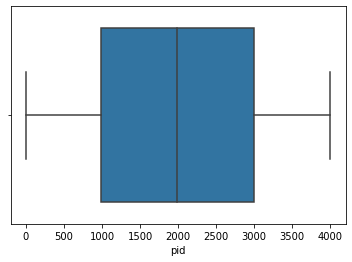

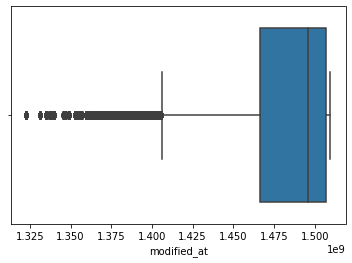

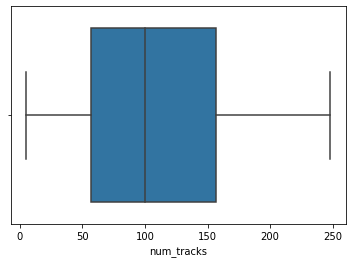

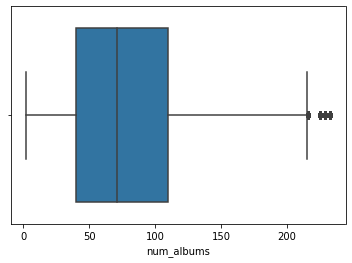

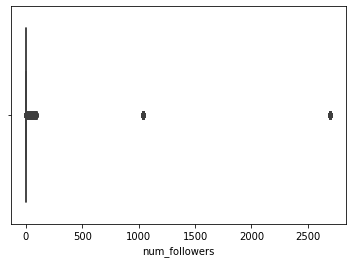

...

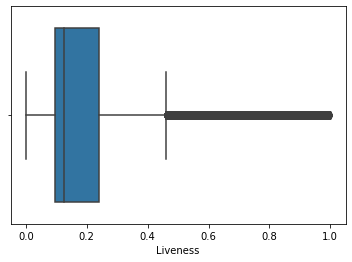

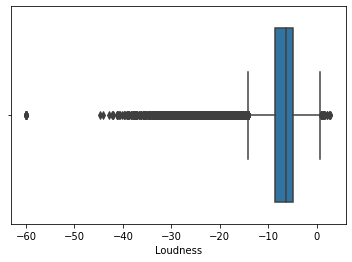

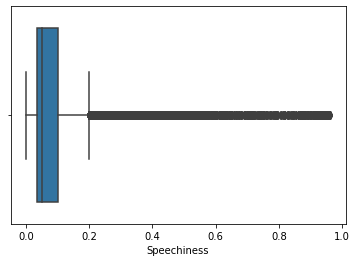

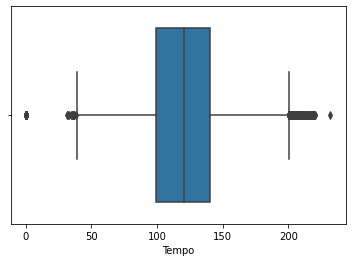

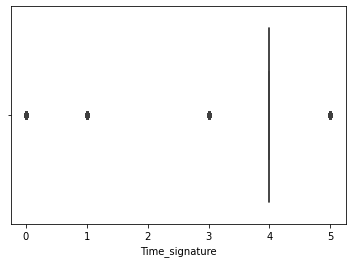

In [27]:
# 3) Outliers.
columns = df.columns
for col in columns: 
    if not (df[col].dtype == 'object' or df[col].dtype == 'datetime64[ns]' or df[col].dtype == 'bool'):
        sns.boxplot(x = df[col])
        plt.show()

In [28]:
# This columns seem to have 1 unique value so lets check it
# num_followers - track_duration_ms- Length - Instrumentalness - Time_signature
unuique_columns = ['num_followers', 'track_duration_ms', 'Length', 'Instrumentalness', 'Time_signature']
for col in unuique_columns:
    new_df = df[col].value_counts().sort_values(ascending=False)
    print(col, 'Uniques Count: ')
    print(new_df)
    print()
    print(col, 'Uniques Percentages: ')
    value_sum = df[col].value_counts().sum()
    try:
        print((new_df[0:50] / value_sum) * 100)
    except:
        print((new_df[:] / value_sum) * 100)
    print()

num_followers Uniques Count: 
1       184112
2        46400
3        16584
4         8121
5         2658
6         2492
7         1220
9          862
8          800
10         427
15         401
13         353
11         284
52         260
18         248
14         212
23         196
16         142
1038        81
27          75
12          67
2699        50
82          45
20          39
53          36
43          35
22          32
17          28
44          24
87          14
Name: num_followers, dtype: int64

num_followers Uniques Percentages: 
1       69.137583
2       17.424089
3        6.227610
4        3.049591
5        0.998130
6        0.935794
7        0.458133
9        0.323698
8        0.300415
10       0.160347
15       0.150583
13       0.132558
11       0.106647
52       0.097635
18       0.093129
14       0.079610
23       0.073602
16       0.053324
1038     0.030417
27       0.028164
12       0.025160
2699     0.018776
82       0.016898
20       0.014645
53       0.013519

Accepted as there is no unique value biased more than 90 % except Time_signature so Drop it

In [29]:
df = df.drop('Time_signature', axis=1)

In [30]:
outliers = ['modified_at', 'num_albums', 'num_followers', 'num_edits', 'playlist_duration_ms', 'num_artists', 'pos', 'track_duration_ms', 'Length', 
 'Acousticness', 'Danceability', 'Energy', 'Instrumentalness', 'Liveness', 'Loudness', 'Speechiness', 'Tempo']
len(outliers)

17

In [31]:
outliers.remove('num_followers')
len(outliers)

16

 Min: 1322611200 Max: 1509494400 
 mean: 1481418569.4883175 std: 34141147.2458213 
 median: 1495843200.0 
 mode: 1509408000


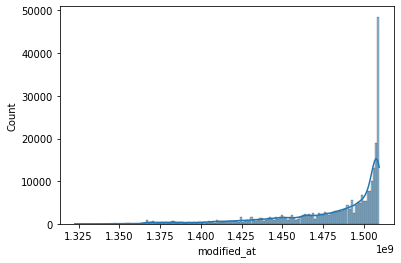

 Min: 2 Max: 233 
 mean: 78.49272243877161 std: 47.731030549512624 
 median: 71.0 
 mode: 42


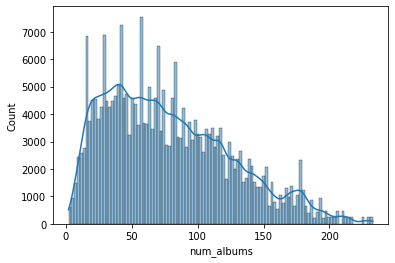

 Min: 2 Max: 178 
 mean: 28.416022651315444 std: 28.72165364910511 
 median: 18.0 
 mode: 2


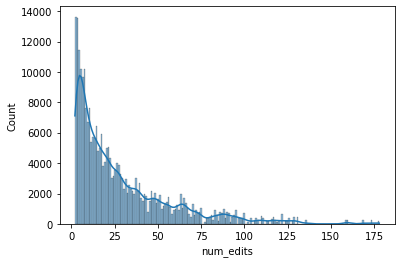

 Min: 923879 Max: 79973898 
 mean: 25692851.41707786 std: 15088529.215302622 
 median: 23308531.0 
 mode: 57599896


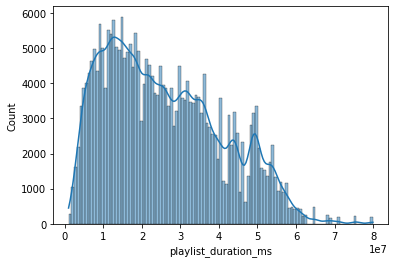

 Min: 3 Max: 199 
 mean: 58.087210568611106 std: 36.989756391629356 
 median: 51.0 
 mode: 51


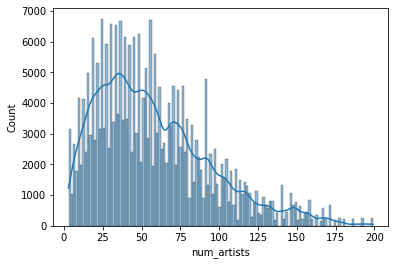

 Min: 0 Max: 247 
 mean: 54.35411831857543 std: 48.16455157469035 
 median: 40.0 
 mode: 0


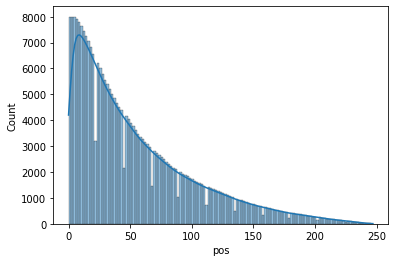

 Min: 0 Max: 5279768 
 mean: 234170.6840344276 std: 73588.37083734604 
 median: 224866.0 
 mode: 219080


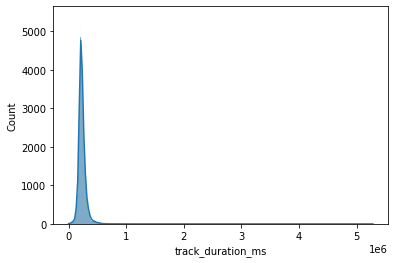

 Min: 3056 Max: 5279768 
 mean: 234206.3940660463 std: 73570.97981563355 
 median: 224874.0 
 mode: 219080


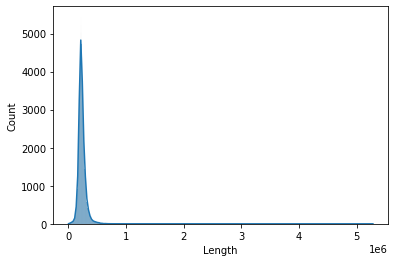

 Min: 0.0 Max: 0.996 
 mean: 0.23019590109707921 std: 0.2735794693134073 
 median: 0.104 
 mode: 0.103


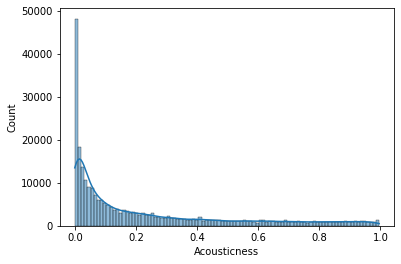

 Min: 0.0 Max: 0.991 
 mean: 0.6060480225161287 std: 0.15936790343446816 
 median: 0.614 
 mode: 0.746


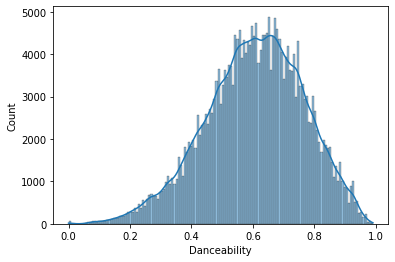

 Min: 0.0 Max: 1.0 
 mean: 0.6473424935031431 std: 0.20827225825562448 
 median: 0.676 
 mode: 0.713


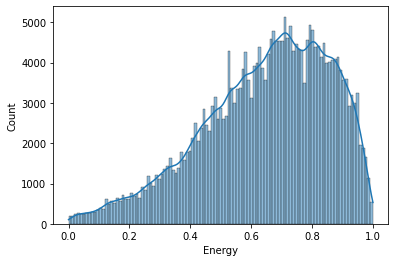

 Min: 0.0 Max: 0.999 
 mean: 0.05449003788939458 std: 0.1839404057466339 
 median: 3.2e-06 
 mode: 0.0


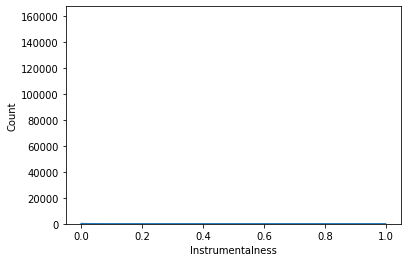

 Min: 0.0 Max: 1.0 
 mean: 0.18956379522189426 std: 0.15560489699614205 
 median: 0.126 
 mode: 0.108


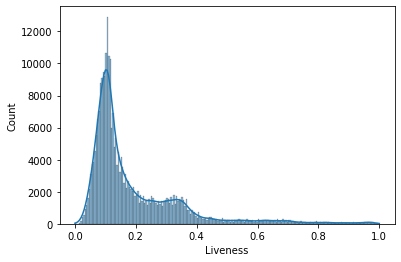

 Min: -60.0 Max: 2.766 
 mean: -7.206601776956642 std: 3.572729135212382 
 median: -6.454 
 mode: -5.886


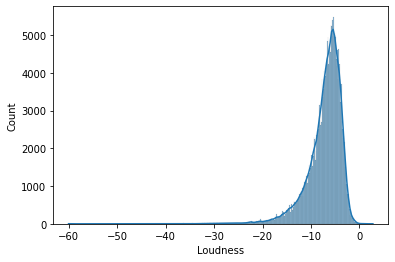

 Min: 0.0 Max: 0.962 
 mean: 0.09318142569602476 std: 0.09951354893448708 
 median: 0.0501 
 mode: 0.0363


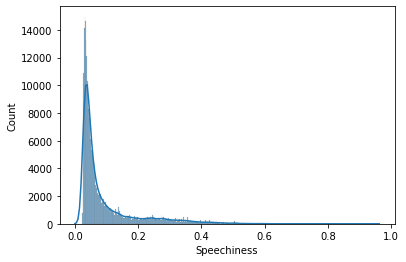

 Min: 0.0 Max: 232.08 
 mean: 121.67535986751682 std: 28.733407342177713 
 median: 120.53 
 mode: 75.016


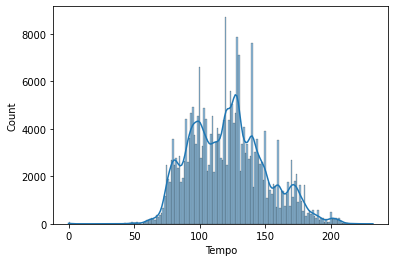

In [32]:
for col in outliers: #distrbution
    sns.histplot(x = df[col], kde=True)
    print(' Min:', df[col].min(), 'Max:', df[col].max(), '\n mean:', df[col].mean(), 'std:', df[col].std(),'\n', 'median:', df[col].median(), '\n', 'mode:', df[col].mode()[0])
    plt.show()

In [33]:
# col = 'num_followers'
# sns.histplot(x = df[col], kde=True)
# print(' Min:', df[col].min(), 'Max:', df[col].max(), '\n mean:', df[col].mean(), 'std:', df[col].std(),'\n', 'median:', df[col].median(), '\n', 'mode:', df[col].mode()[0])
# plt.show()

Modified_at/ Energy/ loudness: left skewed

num_albumns/edits/artists/pos/track_duration_length/Acosutinces/livness/speechiness: right skewed

Tempo: unskewed

**Left skewed or Right skewed or Unskewed  mabye solved by log so lets try it**

Danceability: gaussian dist
Time_signature: looks good

In [34]:
outliers

['modified_at',
 'num_albums',
 'num_edits',
 'playlist_duration_ms',
 'num_artists',
 'pos',
 'track_duration_ms',
 'Length',
 'Acousticness',
 'Danceability',
 'Energy',
 'Instrumentalness',
 'Liveness',
 'Loudness',
 'Speechiness',
 'Tempo']

In [35]:
# outliers_left_right
outliers.remove('Danceability')
len(outliers)

15

 Min: 21.00287380209382 Max: 21.135040597929066 
 mean: 21.1159936095588 std: 0.02348770576840165 
 median: 21.12595589883974 
 mode: 21.134983358582762


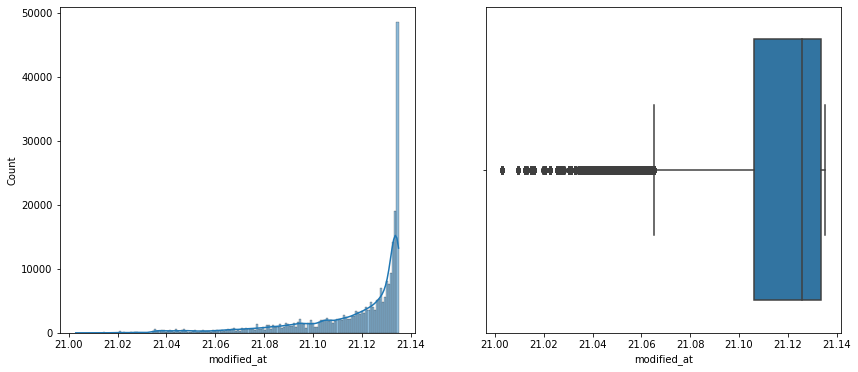

 Min: 1.0986122886681098 Max: 5.455321115357702 
 mean: 4.1566647739577185 std: 0.7215442396538977 
 median: 4.276666119016055 
 mode: 3.7612001156935624


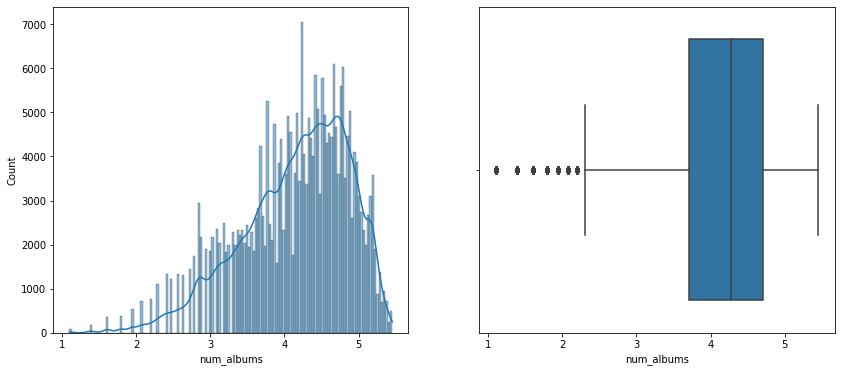

 Min: 1.0986122886681098 Max: 5.187385805840755 
 mean: 2.91959358913578 std: 1.0022580300534718 
 median: 2.9444389791664403 
 mode: 1.0986122886681098


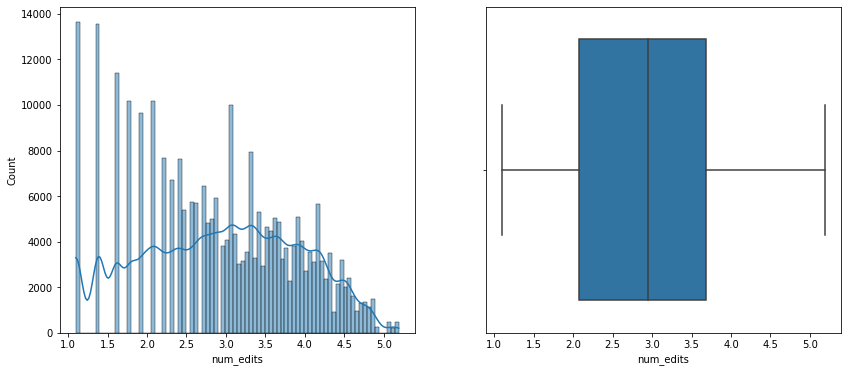

 Min: 13.736337472060095 Max: 18.197210876902968 
 mean: 16.84722601623423 std: 0.7152229331234562 
 median: 16.96433003176581 
 mode: 17.869031337470076


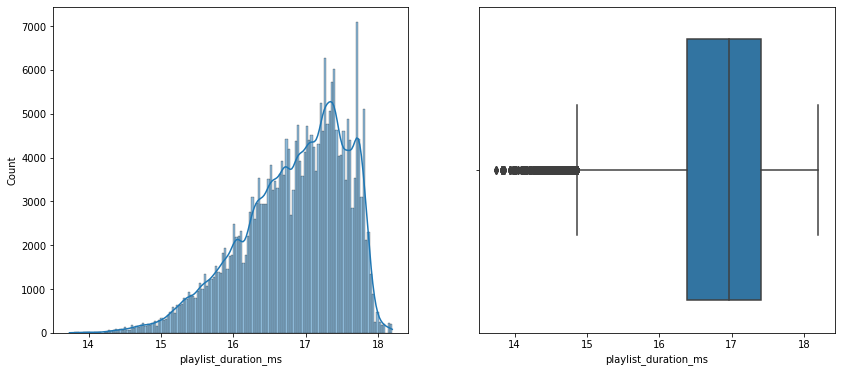

 Min: 1.3862943611198906 Max: 5.298317366548036 
 mean: 3.8520292987005336 std: 0.7338787157715082 
 median: 3.9512437185814275 
 mode: 3.9512437185814275


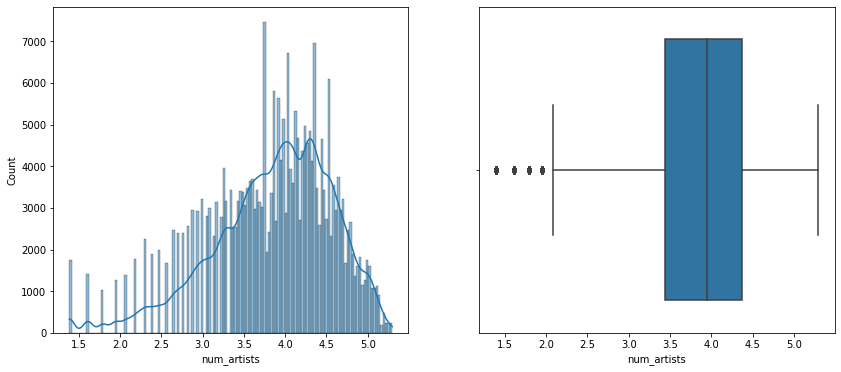

 Min: 0.0 Max: 5.5134287461649825 
 mean: 3.5326203453006824 std: 1.1335423044201949 
 median: 3.713572066704308 
 mode: 0.0


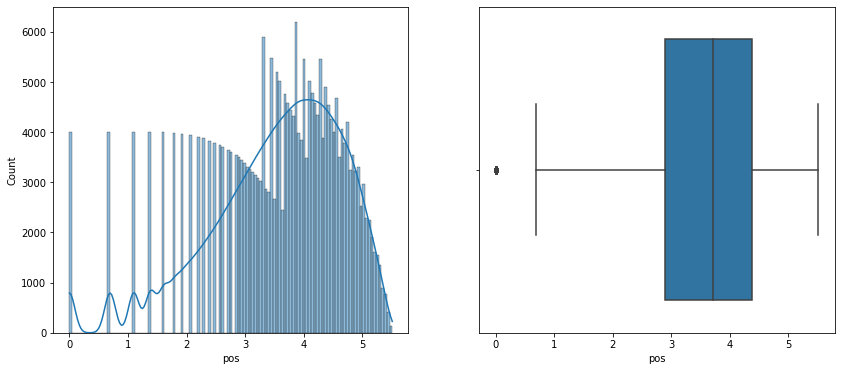

 Min: 0.0 Max: 15.479392904725385 
 mean: 12.327702982576147 std: 0.283056070204655 
 median: 12.323264395300395 
 mode: 12.297196803429873


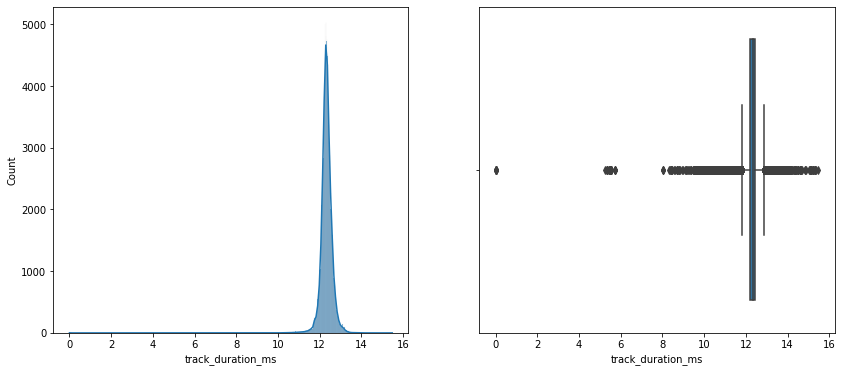

 Min: 8.025189321890835 Max: 15.479392904725385 
 mean: 12.328773257934392 std: 0.26613291249695903 
 median: 12.323299971252835 
 mode: 12.297196803429873


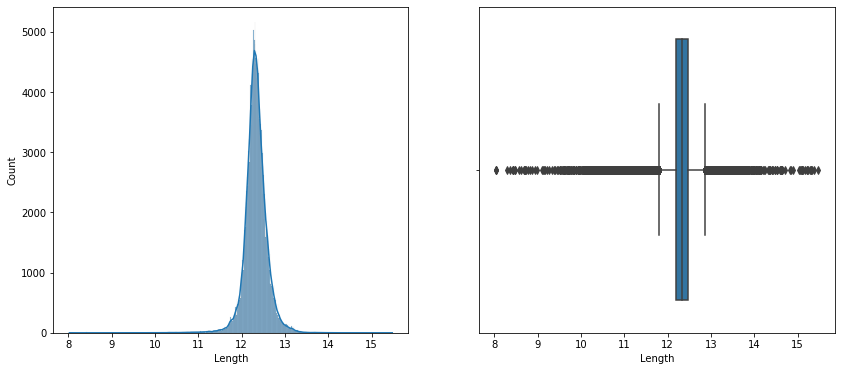

 Min: 0.0 Max: 0.6911451778892722 
 mean: 0.18554325652000223 std: 0.201289106190307 
 median: 0.09893994785490356 
 mode: 0.09803374027136541


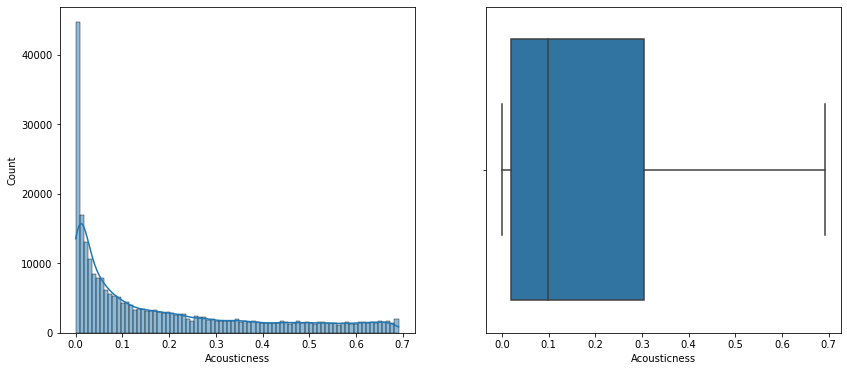

 Min: 0.0 Max: 0.6931471805599453 
 mean: 0.49053731529178063 std: 0.13411341742000912 
 median: 0.5164100020598913 
 mode: 0.5382462193419828


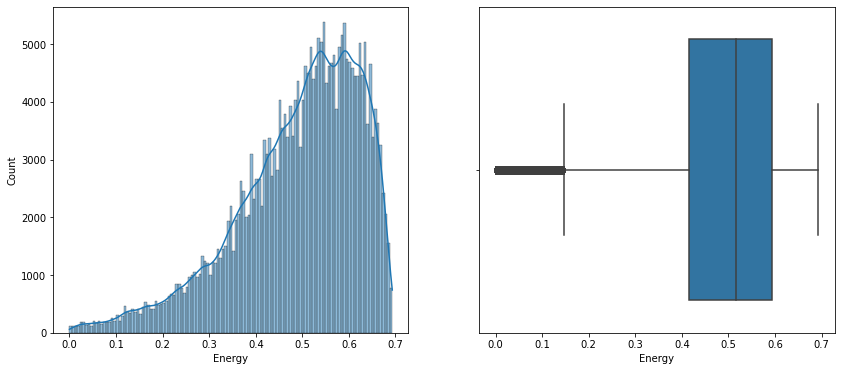

 Min: 0.0 Max: 0.692647055518263 
 mean: 0.0421206575844709 std: 0.1362215530289019 
 median: 3.199994880010923e-06 
 mode: 0.0


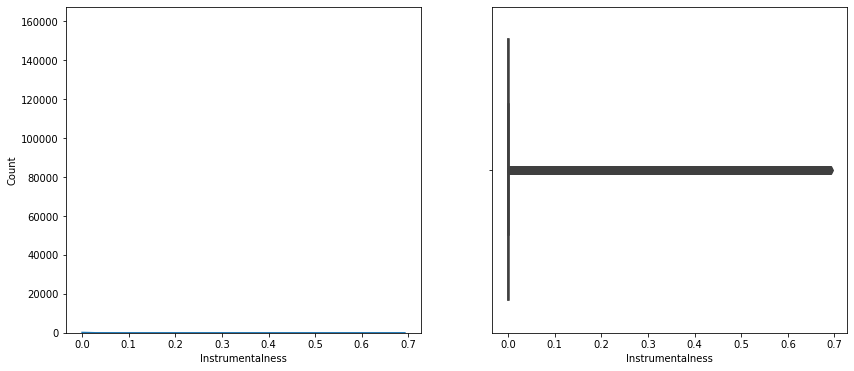

 Min: 0.0 Max: 0.6931471805599453 
 mean: 0.1662262526902825 std: 0.11708789893727246 
 median: 0.11867152971749864 
 mode: 0.10255658832509207


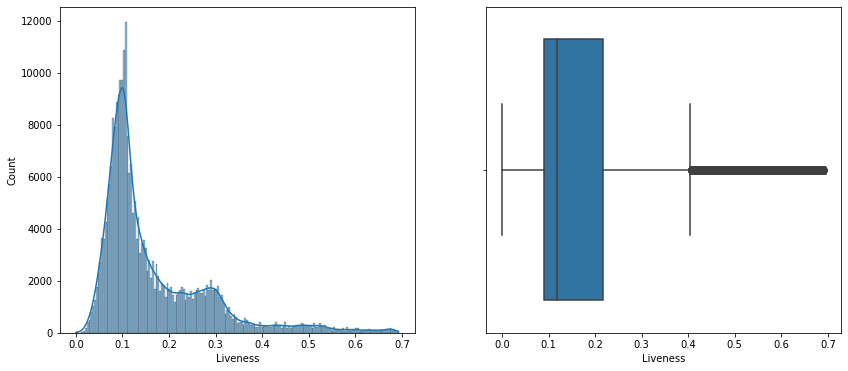

 Min: -6.2146080984221905 Max: 1.3260134302349607 
 mean: -1.300706102449618 std: 1.2333965292348505 
 median: -1.3280254529959148 
 mode: -1.62964061975162


invalid value encountered in log1p


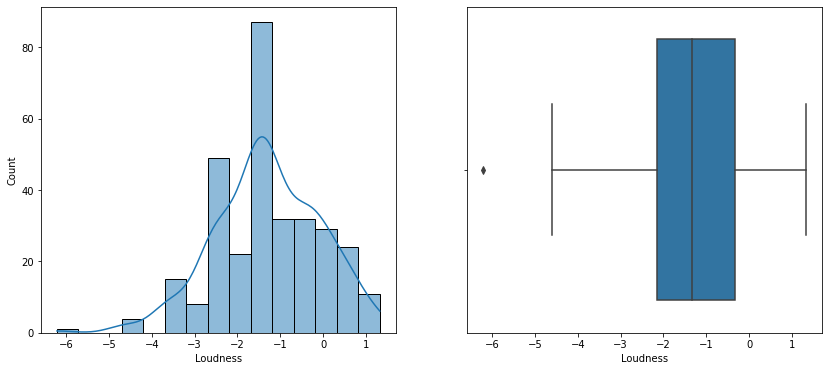

 Min: 0.0 Max: 0.6739643611431714 
 mean: 0.08544564249246854 std: 0.08282092497742871 
 median: 0.048885397729810626 
 mode: 0.035656677208034684


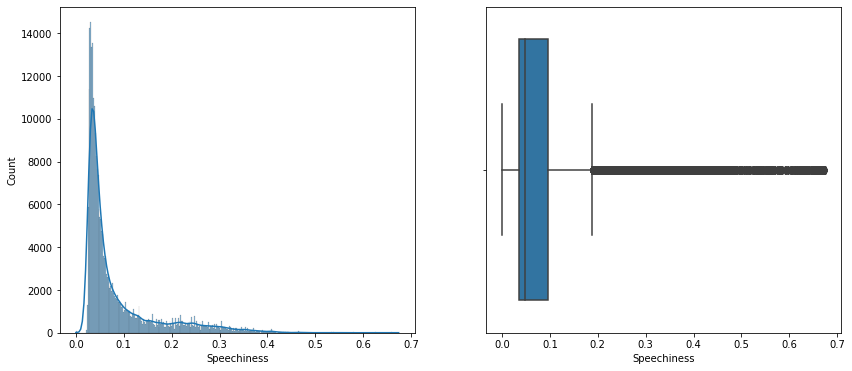

 Min: 0.0 Max: 5.451381742274873 
 mean: 4.780881189064425 std: 0.249913758577992 
 median: 4.800161145882709 
 mode: 4.330943844444565


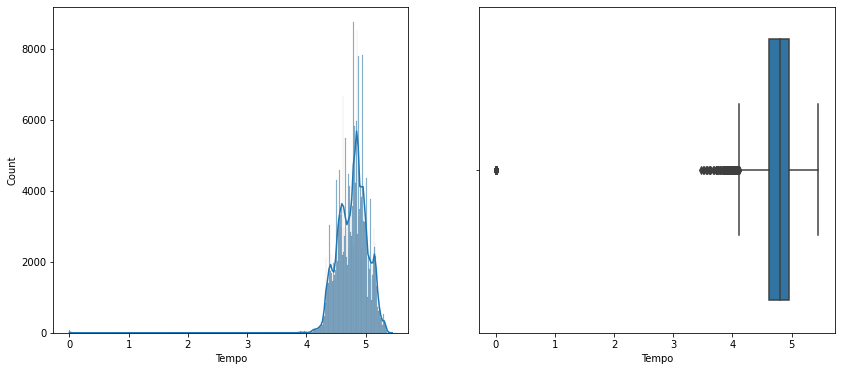

In [36]:
for col in outliers: #distrbution
    data = np.log1p(df[col])
    fig, axes = plt.subplots(1, 2, figsize=(14,6))
    sns.histplot(x = data, kde=True, ax=axes[0])
    sns.boxplot(x = data, ax=axes[1])
    print(' Min:', data.min(), 'Max:', data.max(), '\n mean:', data.mean(), 'std:', data.std(),'\n', 'median:', data.median(), '\n', 'mode:', data.mode()[0])
    plt.show()

* Modified_at/num_albumns/playlist_duration/num_artists/pos/track==length/Energy/Tempo : correct dist but still outlier
* num_edits : correct dist and no outlier

**Loudness have alot of NaNs as log1p(-ve) so be ccarfull log only +ve values so we will use IQR old method**

* Acoustiness/Liveness/Speechiness : right skewed / no outliers but right skewed so bad model
* Instrumentalness/num_followers : left skewed & outliers

In [37]:
# outliers
outliers_log_good_outliers = ['modified_at', 'num_albums', 'playlist_duration_ms', 'num_artists', 'pos', 'track_duration_ms', 'Length', 'Energy', 'Tempo'] # log then IQR
outliers_log_good = ['num_edits'] # log it only
outliers_bad = ['Acousticness', 'Liveness', 'Speechiness', 'Instrumentalness', 'num_followers', 'Loudness'] # dont log then IQR
outliers_normal_dist = ['Danceability'] # dont log then IQR
print(len(outliers_log_good_outliers) + len(outliers_log_good) + len(outliers_bad) + len(outliers_normal_dist))

17


In [38]:
# target and item_visability are outliers
def remove_outlier(col):
    sorted(col) #sort column then get Q1, Q3 at 25% and 75% of sorted col
    Q1, Q3 = col.quantile([0.25, 0.75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range, upper_range

In [39]:
df[outliers_log_good + outliers_log_good_outliers] = np.log1p(df[outliers_log_good + outliers_log_good_outliers]) # log it only
df[outliers_log_good + outliers_log_good_outliers].describe()

,num_edits,modified_at,num_albums,playlist_duration_ms,num_artists,pos,track_duration_ms,Length,Energy,Tempo
count,266298.000000,266298.000000,266298.000000,266298.000000,266298.000000,266298.000000,266298.000000,266298.000000,266298.000000,266298.000000
mean,2.919594,21.115994,4.156665,16.847226,3.852029,3.532620,12.327703,12.328773,0.490537,4.780881
std,1.002258,0.023488,0.721544,0.715223,0.733879,1.133542,0.283056,0.266133,0.134113,0.249914
min,1.098612,21.002874,1.098612,13.736337,1.386294,0.000000,0.000000,8.025189,0.000000,0.000000
25%,2.079442,21.106122,3.713572,16.388206,3.433987,2.890372,12.197506,12.197506,0.414755,4.610558
50%,2.944439,21.125956,4.276666,16.964330,3.951244,3.713572,12.323264,12.323300,0.516410,4.800161
75%,3.688879,21.133379,4.709530,17.404943,4.369448,4.382027,12.463142,12.463142,0.593879,4.948724
max,5.187386,21.135041,5.455321,18.197211,5.298317,5.513429,15.479393,15.479393,0.693147,5.451382


In [40]:
outliers_IQR = outliers_log_good_outliers + outliers_bad + outliers_normal_dist
outliers_IQR

['modified_at',
 'num_albums',
 'playlist_duration_ms',
 'num_artists',
 'pos',
 'track_duration_ms',
 'Length',
 'Energy',
 'Tempo',
 'Acousticness',
 'Liveness',
 'Speechiness',
 'Instrumentalness',
 'num_followers',
 'Loudness',
 'Danceability']

21.065236213724994 21.17426519215325


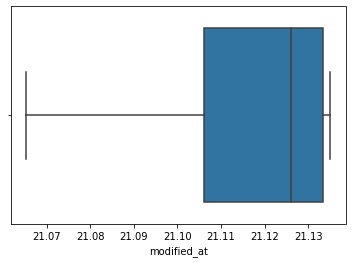

2.219634864792269 6.203467403224373


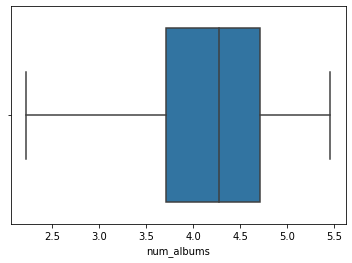

14.863101382404263 18.93004802256456


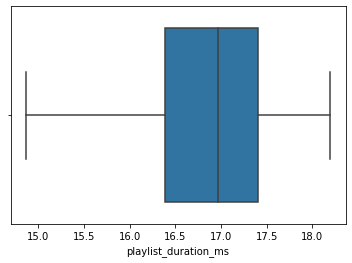

2.0307962325123334 5.772638824439834


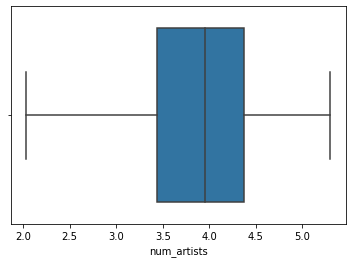

0.6528894427295895 6.619508949840457


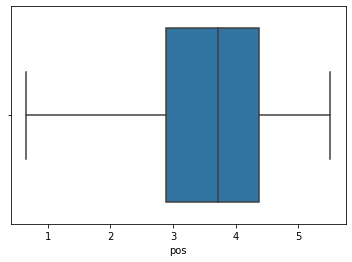

11.799051919826535 12.861596285259903


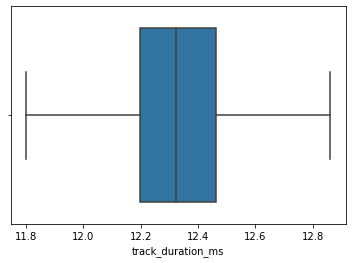

11.799051919826535 12.861596285259903


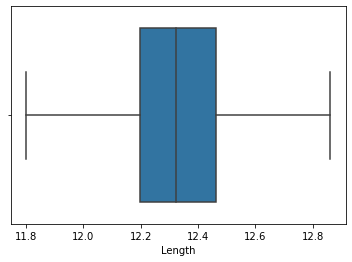

0.14606911918622806 0.8625652147303053


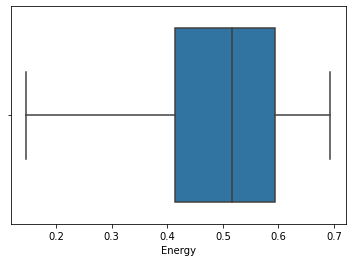

4.10330871837021 5.455973854988281


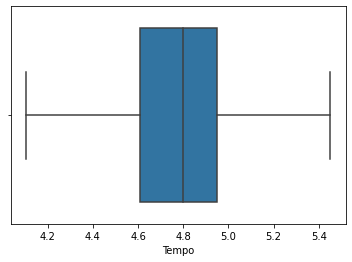

-0.4835 0.8613


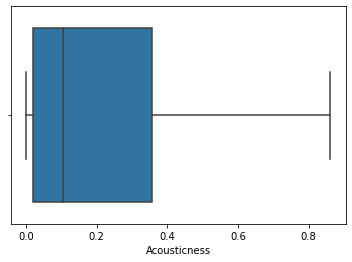

-0.1255 0.4609


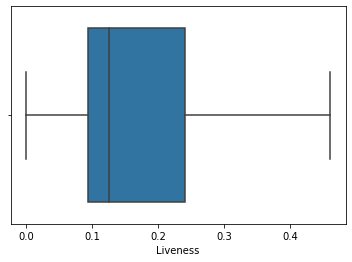

-0.06250000000000003 0.19910000000000003


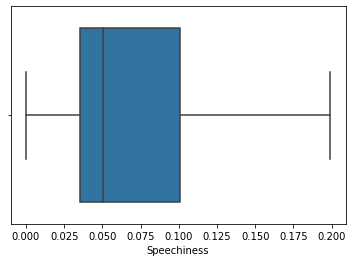

-0.001098 0.00183


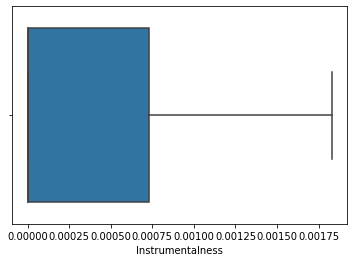

-0.5 3.5


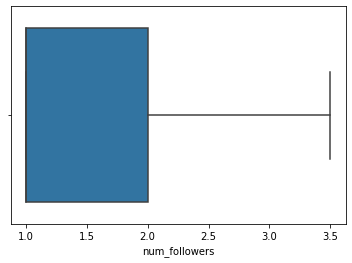

-14.251875 0.743125


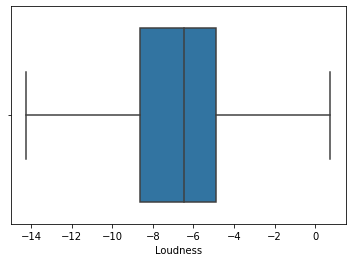

0.17100000000000004 1.051


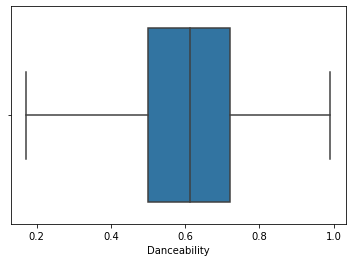

In [41]:
# 2nd: IQR
# replace outlier of larger than upper_limit with the value of upper limit
# and lower that lower_limit with lower limit
for col in outliers_IQR:
    low_item_visability, high_item_visability = remove_outlier(df[col]) #lower and upper range
    df[col] = np.where(df[col] < low_item_visability, low_item_visability, df[col])
    df[col] = np.where(df[col] > high_item_visability, high_item_visability, df[col])
    print(low_item_visability, high_item_visability)
    sns.boxplot(x=df[col])
    plt.show()

 Min: 21.065236213724994 Max: 21.135040597929066 
 mean: 21.116902131282888 std: 0.02086466646272884 
 median: 21.12595589883974 
 mode: 21.065236213724994


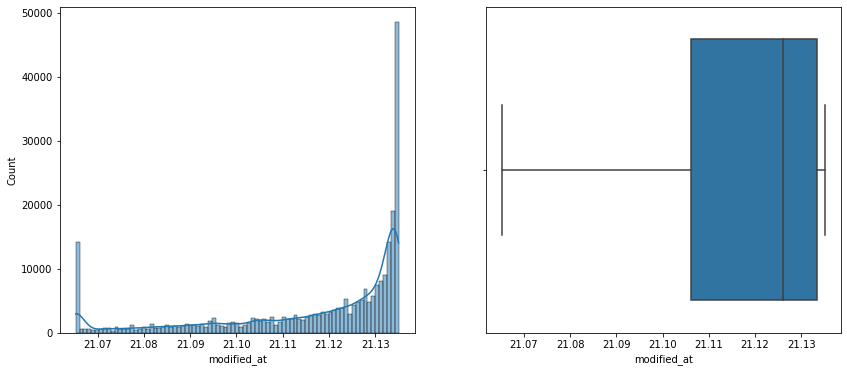

 Min: 2.219634864792269 Max: 5.455321115357702 
 mean: 4.160085990611795 std: 0.7109589847475137 
 median: 4.276666119016055 
 mode: 3.7612001156935624


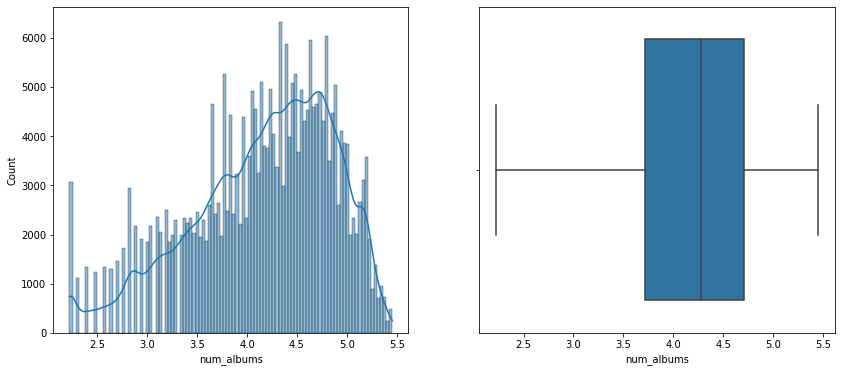

 Min: 1.0 Max: 3.5 
 mean: 1.4790610519042577 std: 0.8028188649084091 
 median: 1.0 
 mode: 1.0


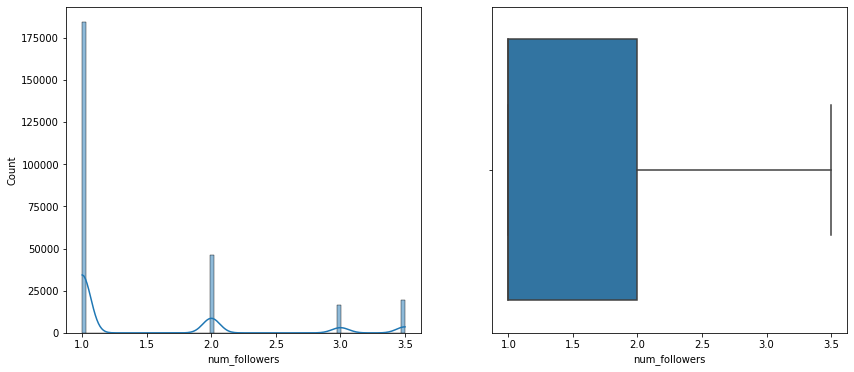

 Min: 1.0986122886681098 Max: 5.187385805840755 
 mean: 2.91959358913578 std: 1.0022580300534718 
 median: 2.9444389791664403 
 mode: 1.0986122886681098


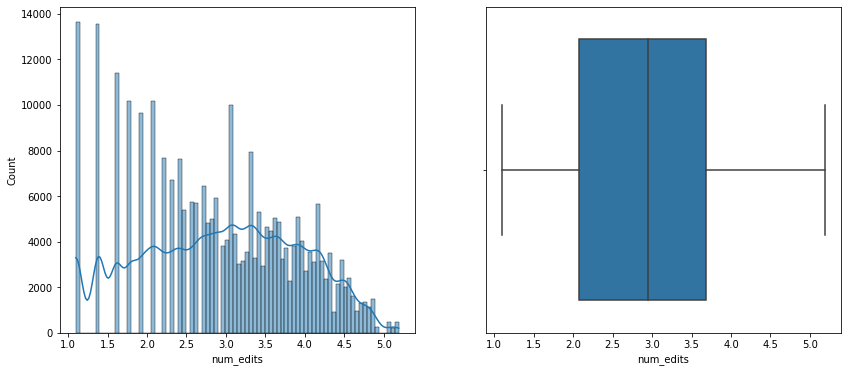

 Min: 14.863101382404263 Max: 18.197210876902968 
 mean: 16.849740085715506 std: 0.7073744846433409 
 median: 16.96433003176581 
 mode: 14.863101382404263


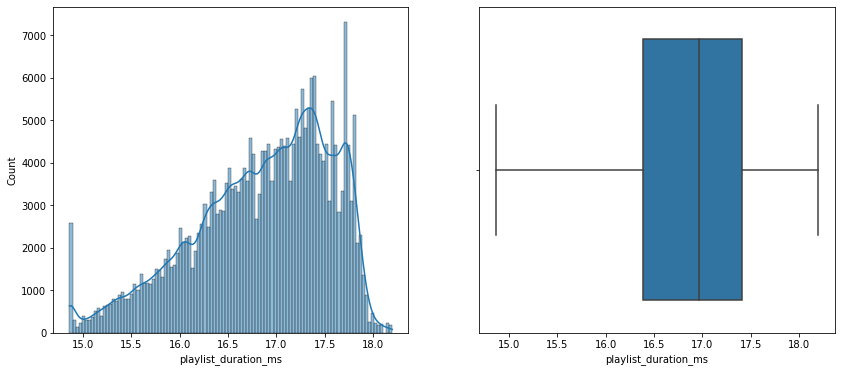

 Min: 2.0307962325123334 Max: 5.298317366548036 
 mean: 3.85983324385471 std: 0.7114563021692747 
 median: 3.9512437185814275 
 mode: 2.0307962325123334


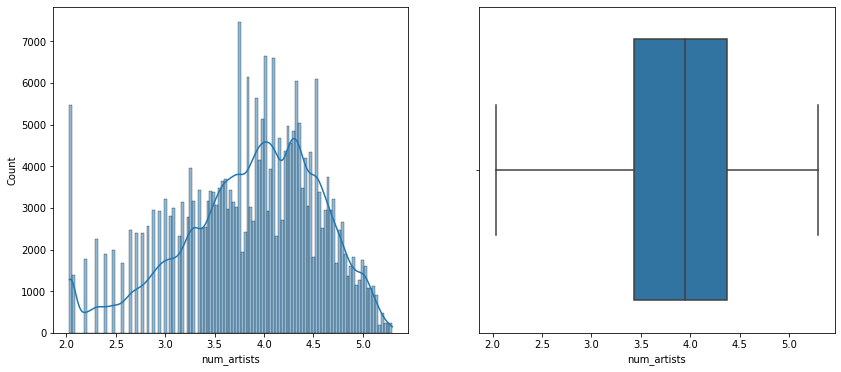

 Min: 0.6528894427295895 Max: 5.5134287461649825 
 mean: 3.542424793255513 std: 1.1054194806423356 
 median: 3.713572066704308 
 mode: 0.6528894427295895


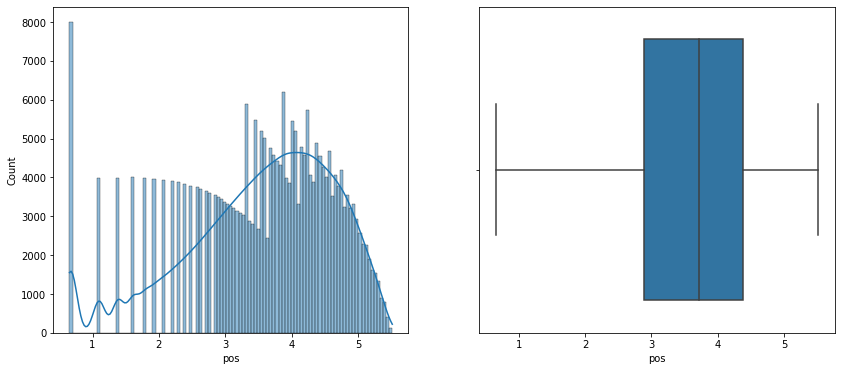

 Min: 11.799051919826535 Max: 12.861596285259903 
 mean: 12.331182598159632 std: 0.2223928523746784 
 median: 12.323264395300395 
 mode: 12.861596285259903


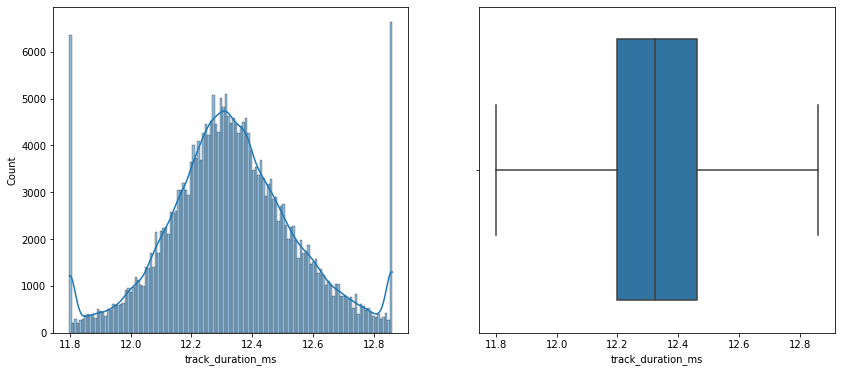

 Min: 11.799051919826535 Max: 12.861596285259903 
 mean: 12.331252962900807 std: 0.22234403677997372 
 median: 12.323299971252835 
 mode: 12.861596285259903


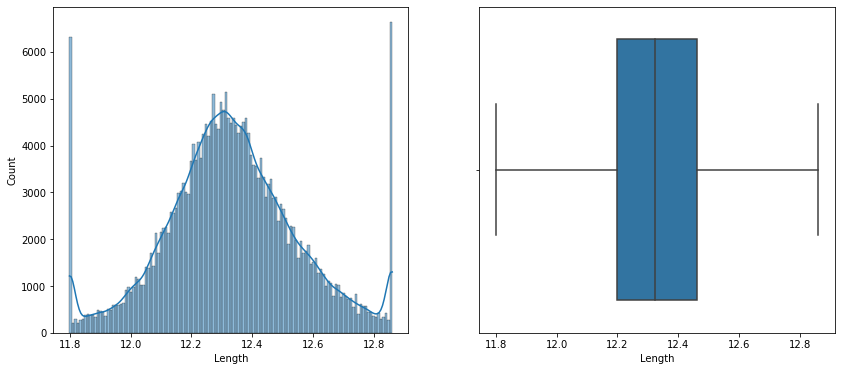

 Min: 0.0 Max: 0.8613 
 mean: 0.2269654769106415 std: 0.26544887052655625 
 median: 0.104 
 mode: 0.8613


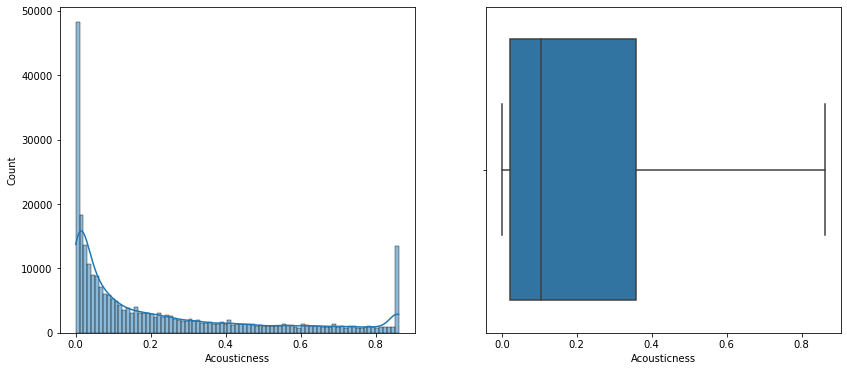

 Min: 0.17100000000000004 Max: 0.991 
 mean: 0.6063033894358951 std: 0.15860123779762011 
 median: 0.614 
 mode: 0.17100000000000004


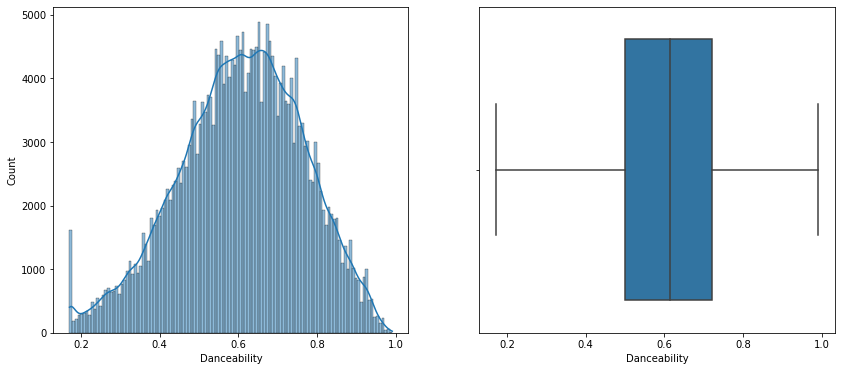

 Min: 0.14606911918622806 Max: 0.6931471805599453 
 mean: 0.4917946511829317 std: 0.13042128487674454 
 median: 0.5164100020598913 
 mode: 0.14606911918622806


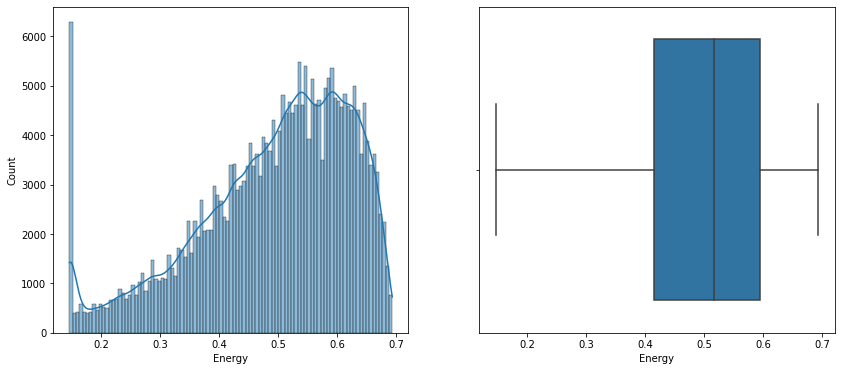

 Min: 0.0 Max: 0.00183 
 mean: 0.00046457250850550876 std: 0.0007521207363057312 
 median: 3.2e-06 
 mode: 0.0


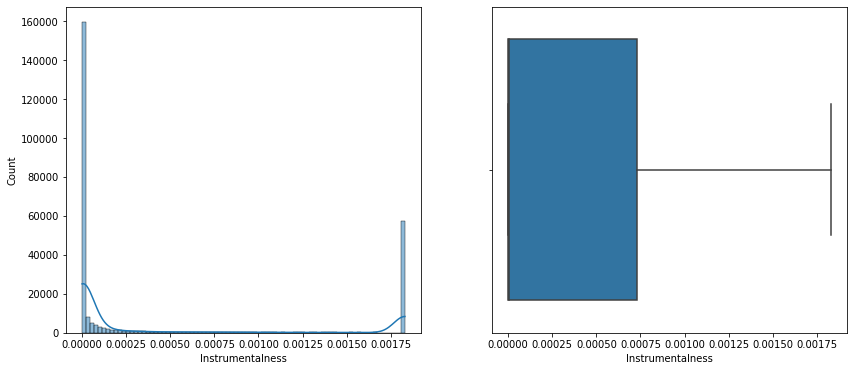

 Min: 0.0 Max: 0.4609 
 mean: 0.17742209006451415 std: 0.1175504635602676 
 median: 0.126 
 mode: 0.4609


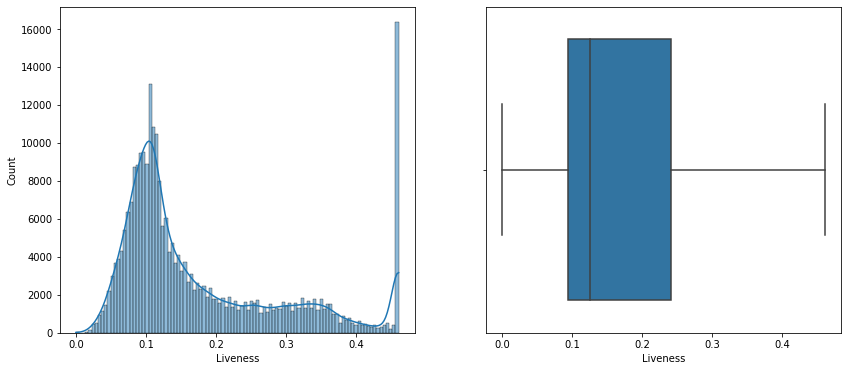

 Min: -14.251875 Max: 0.743125 
 mean: -7.036758441670609 std: 2.972503275073463 
 median: -6.454 
 mode: -14.251875


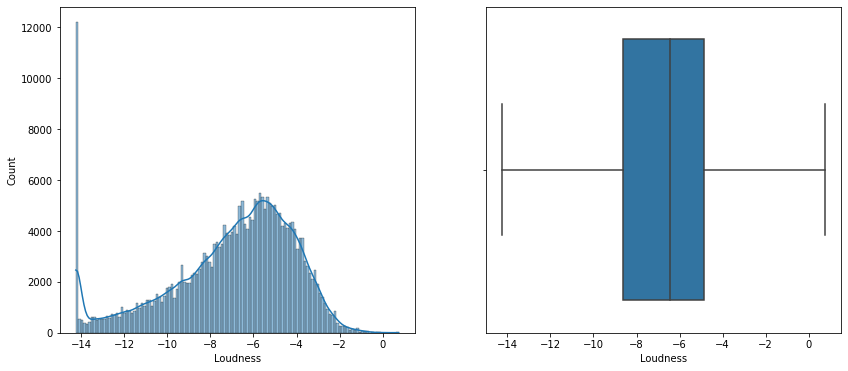

 Min: 0.0 Max: 0.19910000000000003 
 mean: 0.07814747726231513 std: 0.05855825926800997 
 median: 0.0501 
 mode: 0.19910000000000003


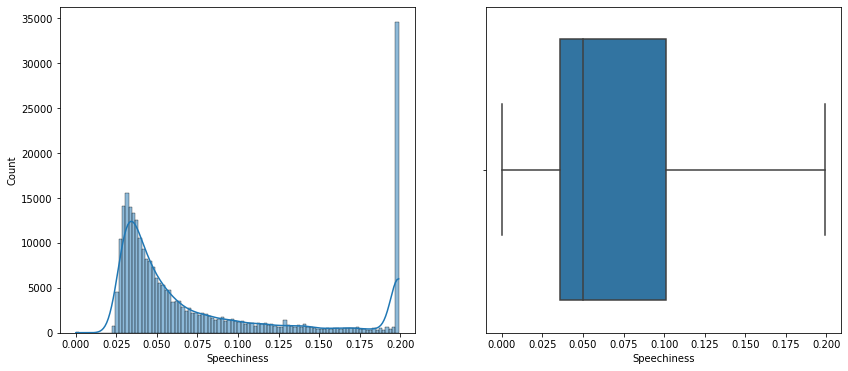

 Min: 4.10330871837021 Max: 5.451381742274873 
 mean: 4.7822378893247395 std: 0.23627820490041218 
 median: 4.800161145882709 
 mode: 4.10330871837021


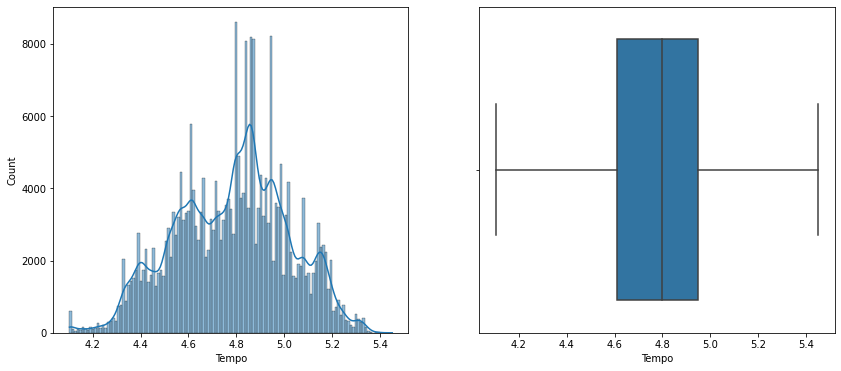

In [42]:
outliers = ['modified_at', 'num_albums', 'num_followers', 'num_edits', 'playlist_duration_ms', 'num_artists', 'pos', 'track_duration_ms', 'Length', 
 'Acousticness', 'Danceability', 'Energy', 'Instrumentalness', 'Liveness', 'Loudness', 'Speechiness', 'Tempo']
for col in outliers: #distrbution
    data = df[col]
    fig, axes = plt.subplots(1, 2, figsize=(14,6))
    sns.histplot(x = data, kde=True, ax=axes[0])
    sns.boxplot(x = data, ax=axes[1])
    print(' Min:', data.min(), 'Max:', data.max(), '\n mean:', data.mean(), 'std:', data.std(),'\n', 'median:', data.median(), '\n', 'mode:', data.mode()[0])
    plt.show()

### Checking Features Extracted vs Dataset (data inconsistency)

In [43]:
columns = df.columns
categorical_columns = []
numeric_columns = []
boolen_columns = []
date_columns = []

for col in columns:
    if df[col].dtype == 'object':
        categorical_columns.append(col)
    elif df[col].dtype == 'int64' or df[col].dtype == 'float64':
        numeric_columns.append(col)
    elif df[col].dtype == 'bool':
        boolen_columns.append(col)
    else:
        date_columns.append(col)
categorical_columns

['name',
 'artist_name',
 'track_uri',
 'artist_uri',
 'track_name',
 'album_uri',
 'album_name',
 'Name',
 'Album',
 'Artist']

In [44]:
for col in categorical_columns: # 80 % of data consistency
    df[col] = df[col].str.strip()

In [45]:
# diff columns
df['Name'] = df['Name'].str.strip()
df['track_name'] = df['track_name'].str.strip()

df['Album'] = df['Album'].str.strip()
df['album_name'] = df['album_name'].str.strip()

df['Artist'] = df['Artist'].str.strip()
df['artist_name'] = df['artist_name'].str.strip()

# df['Length'] = df['Length'].astype('object').str.strip()
# df['track_duration_ms'] = df['track_duration_ms'].astype('object').str.strip()

In [46]:
list_of_boolen =  ~(df['Album'] == df['album_name'])
print('diffrence in: ', list_of_boolen.sum(), ' elements') # diff should be 0
index = df[list_of_boolen].index # T F T

df.loc[index, ['Album', 'album_name']]

diffrence in:  48357  elements


,Album,album_name
4,Hot Shot (International Version #2),Hot Shot
6,Confessions (Expanded Edition),Confessions
14,Cassie (U.S. Version),Cassie
17,Chris Brown (Expanded Edition),Chris Brown
21,Elephunk (International Version),Elephunk
...,...,...
266377,Jagged Little Pill (2015 Remaster),Jagged Little Pill (Remastered)
266378,Jagged Little Pill (2015 Remaster),Jagged Little Pill (Remastered)
266380,Jagged Little Pill (2015 Remaster),Jagged Little Pill (Remastered)
266381,The Collection (Standard Edition),The Collection


In [47]:
list_of_boolen =  ~(df['Name'] == df['track_name'])
print('diffrence in: ', list_of_boolen.sum(), ' elements') # diff should be 0
index = df[list_of_boolen].index # T F T

df.loc[index, ['Name', 'track_name']]

diffrence in:  33156  elements


,Name,track_name
2,Crazy In Love (feat. Jay-Z),Crazy In Love
9,Hey Ya!,Hey Ya! - Radio Mix / Club Mix
17,Run It! (feat. Juelz Santana),Run It!
18,Check On It (feat. Bun B & Slim Thug),Check On It - feat. Bun B and Slim Thug
23,Just the Girl,Just The Girl
...,...,...
266376,Ironic - 2015 Remaster,Ironic - 2015 Remastered
266377,You Oughta Know - 2015 Remaster,You Oughta Know - 2015 Remastered
266378,Hand in My Pocket - 2015 Remaster,Hand In My Pocket - 2015 Remastered
266380,Head over Feet - 2015 Remaster,Head Over Feet - 2015 Remastered


In [48]:
list_of_boolen =  ~(df['Artist'] == df['artist_name'])
print('diffrence in: ', list_of_boolen.sum(), ' elements') # diff should be 0
index = df[list_of_boolen].index # T F T

df.loc[index, ['Artist', 'artist_name']]

diffrence in:  18116  elements


,Artist,artist_name
9,Outkast,OutKast
21,Black Eyed Peas,The Black Eyed Peas
48,Cast Of Camp Rock,Demi Lovato
61,Lin-Manuel Miranda,Leslie Odom Jr.
62,Lin-Manuel Miranda,Christopher Jackson
...,...,...
266085,SUUNS,Suuns
266093,Mark Farina,Jazz Spastiks
266120,Eminem,Drake
266259,A$AP ANT,A$Ap Ant


In [49]:
# just drop old data + unusefull data
drop = ['track_name', 'album_name', 'artist_name', 'track_duration_ms', 'track_uri', 'artist_uri', 'album_uri', 'pid']
df = df.drop(drop, axis=1)
df

,name,collaborative,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,pos,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,parsed_Release_date
0,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,0.652889,...,67,0.03110,0.904,0.594983,0.001830,0.0471,-7.105,0.1210,4.839934,2005-07-04
1,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,0.693147,...,81,0.02490,0.774,0.608678,0.001830,0.2420,-3.914,0.1140,4.970091,2003-11-13
2,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.098612,...,21,0.00238,0.664,0.564177,0.000000,0.0598,-6.583,0.1991,4.607757,2003-06-23
3,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.386294,...,76,0.20100,0.892,0.538830,0.000234,0.0521,-6.055,0.1410,4.624698,2002-11-04
4,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.609438,...,0,0.05610,0.853,0.473747,0.000000,0.3130,-4.596,0.0713,4.561835,2000-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.532599,...,58,0.02230,0.380,0.430483,0.001830,0.0940,-5.493,0.0313,4.855275,2005-11-11
266382,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.543295,...,61,0.00415,0.401,0.534151,0.000000,0.0916,-7.554,0.0404,5.133849,1995-01-01
266383,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.553877,...,58,0.00192,0.513,0.598837,0.000003,0.4609,-5.428,0.0299,4.614645,2002-02-25
266384,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.564348,...,0,0.01310,0.381,0.611937,0.000000,0.3180,-7.123,0.1440,5.273000,2014-10-13


In [50]:
df.rename(columns = {'Name':'track_name', 'Album':'album_name', 'Artist':'artist_name', 'Length':'track_duration_ms'}, inplace = True)
df

,name,collaborative,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,pos,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,parsed_Release_date
0,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,0.652889,...,67,0.03110,0.904,0.594983,0.001830,0.0471,-7.105,0.1210,4.839934,2005-07-04
1,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,0.693147,...,81,0.02490,0.774,0.608678,0.001830,0.2420,-3.914,0.1140,4.970091,2003-11-13
2,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.098612,...,21,0.00238,0.664,0.564177,0.000000,0.0598,-6.583,0.1991,4.607757,2003-06-23
3,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.386294,...,76,0.20100,0.892,0.538830,0.000234,0.0521,-6.055,0.1410,4.624698,2002-11-04
4,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.609438,...,0,0.05610,0.853,0.473747,0.000000,0.3130,-4.596,0.0713,4.561835,2000-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.532599,...,58,0.02230,0.380,0.430483,0.001830,0.0940,-5.493,0.0313,4.855275,2005-11-11
266382,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.543295,...,61,0.00415,0.401,0.534151,0.000000,0.0916,-7.554,0.0404,5.133849,1995-01-01
266383,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.553877,...,58,0.00192,0.513,0.598837,0.000003,0.4609,-5.428,0.0299,4.614645,2002-02-25
266384,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.564348,...,0,0.01310,0.381,0.611937,0.000000,0.3180,-7.123,0.1440,5.273000,2014-10-13


# 3) EDA (Explinatory Data Analysis)

### Univariate Analysis

From EDA url

**For each variable (independant = (features) or dependant = (Label)) get 1, 2, 3 by a & b**

1) dtype, count, unique values

2) min, max, mean, median, mode, std

3) dist + skewness & count (pie or countplot) 


* a) numeric variable: distrbution of each feature.
* b) categorical variable: percentages.

### bivariate Analysis

**Relation between independant variable and target (dependant variable)**

1) corr matrix by heatmap (remove one feature corr btn them is very large corr > 0.9, as they should be independant variables)

2) a, b & c

a) Numerical vs. Numerical
1. Scatterplot
2. Line plot (for trends)
3. Heatmap for correlation (correlation matrix) .corr
4. Joint plot

b) Categorical vs. Numerical
1. Bar chart
2. Violin plot
3. Categorical box plot
4.Swarm plot

c) Two Categorical Variables
1. Bar chart
2. Grouped bar chart
3. Point plot

### Multivariate Analysis

**just use pairplot**

---

### univariate analysis
#### a) numeric variable

In [51]:
df

,name,collaborative,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,pos,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,parsed_Release_date
0,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,0.652889,...,67,0.03110,0.904,0.594983,0.001830,0.0471,-7.105,0.1210,4.839934,2005-07-04
1,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,0.693147,...,81,0.02490,0.774,0.608678,0.001830,0.2420,-3.914,0.1140,4.970091,2003-11-13
2,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.098612,...,21,0.00238,0.664,0.564177,0.000000,0.0598,-6.583,0.1991,4.607757,2003-06-23
3,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.386294,...,76,0.20100,0.892,0.538830,0.000234,0.0521,-6.055,0.1410,4.624698,2002-11-04
4,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.609438,...,0,0.05610,0.853,0.473747,0.000000,0.3130,-4.596,0.0713,4.561835,2000-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.532599,...,58,0.02230,0.380,0.430483,0.001830,0.0940,-5.493,0.0313,4.855275,2005-11-11
266382,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.543295,...,61,0.00415,0.401,0.534151,0.000000,0.0916,-7.554,0.0404,5.133849,1995-01-01
266383,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.553877,...,58,0.00192,0.513,0.598837,0.000003,0.4609,-5.428,0.0299,4.614645,2002-02-25
266384,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.564348,...,0,0.01310,0.381,0.611937,0.000000,0.3180,-7.123,0.1440,5.273000,2014-10-13


In [52]:
columns = df.columns
categorical_columns = []
numeric_columns = []
boolen_columns = []
date_columns = []

for col in columns:
    if df[col].dtype == 'object':
        categorical_columns.append(col)
    elif df[col].dtype == 'int64' or df[col].dtype == 'float64':
        numeric_columns.append(col)
    elif df[col].dtype == 'bool':
        boolen_columns.append(col)
    else:
        date_columns.append(col)
categorical_columns

['name', 'track_name', 'album_name', 'artist_name']

 Min: 21.065236213724994 Max: 21.135040597929066 
 mean: 21.116902131282888 std: 0.02086466646272884 
 median: 21.12595589883974 
 mode: 21.065236213724994


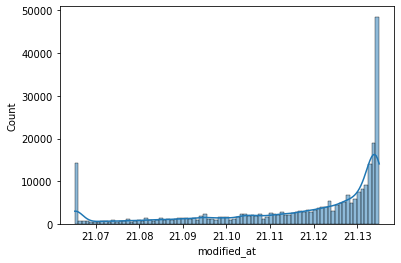

 Min: 5 Max: 248 
 mean: 109.70760576497007 std: 62.853634994684164 
 median: 100.0 
 mode: 53


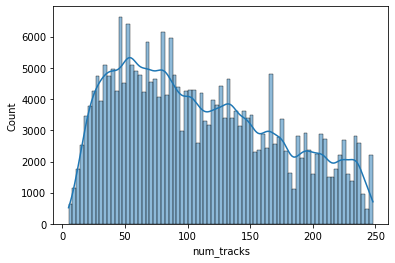

 Min: 2.219634864792269 Max: 5.455321115357702 
 mean: 4.160085990611795 std: 0.7109589847475137 
 median: 4.276666119016055 
 mode: 3.7612001156935624


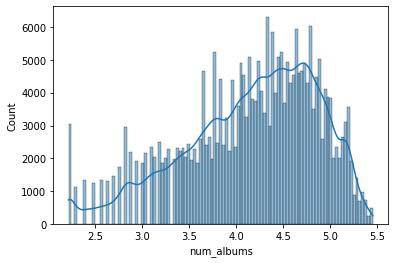

 Min: 1.0 Max: 3.5 
 mean: 1.4790610519042577 std: 0.8028188649084091 
 median: 1.0 
 mode: 1.0


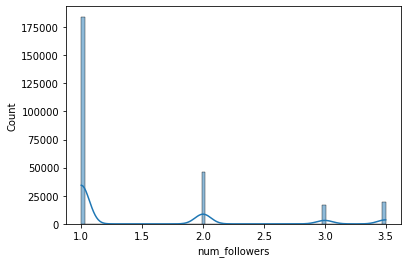

 Min: 1.0986122886681098 Max: 5.187385805840755 
 mean: 2.91959358913578 std: 1.0022580300534718 
 median: 2.9444389791664403 
 mode: 1.0986122886681098


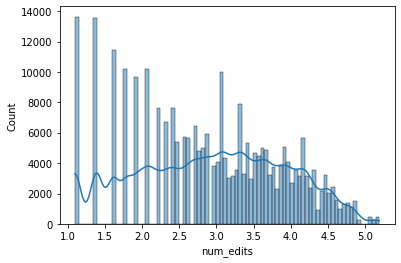

 Min: 14.863101382404263 Max: 18.197210876902968 
 mean: 16.849740085715506 std: 0.7073744846433409 
 median: 16.96433003176581 
 mode: 14.863101382404263


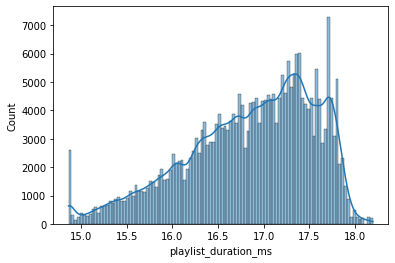

 Min: 2.0307962325123334 Max: 5.298317366548036 
 mean: 3.85983324385471 std: 0.7114563021692747 
 median: 3.9512437185814275 
 mode: 2.0307962325123334


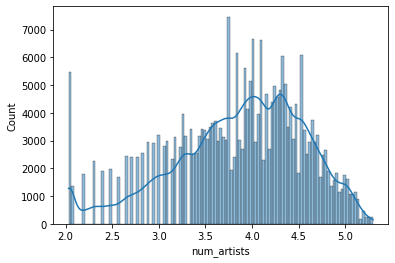

 Min: 0.6528894427295895 Max: 5.5134287461649825 
 mean: 3.542424793255513 std: 1.1054194806423356 
 median: 3.713572066704308 
 mode: 0.6528894427295895


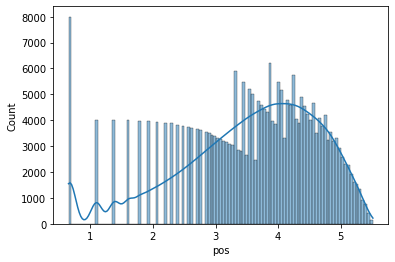

 Min: 11.799051919826535 Max: 12.861596285259903 
 mean: 12.331252962900807 std: 0.22234403677997372 
 median: 12.323299971252835 
 mode: 12.861596285259903


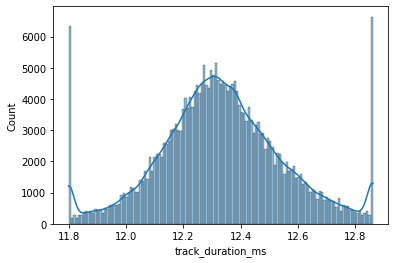

 Min: 0 Max: 92 
 mean: 35.70084642017589 std: 28.99319808649693 
 median: 40.0 
 mode: 0


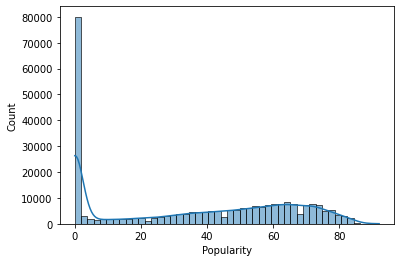

 Min: 0.0 Max: 0.8613 
 mean: 0.2269654769106415 std: 0.26544887052655625 
 median: 0.104 
 mode: 0.8613


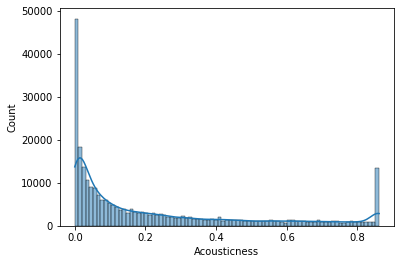

 Min: 0.17100000000000004 Max: 0.991 
 mean: 0.6063033894358951 std: 0.15860123779762011 
 median: 0.614 
 mode: 0.17100000000000004


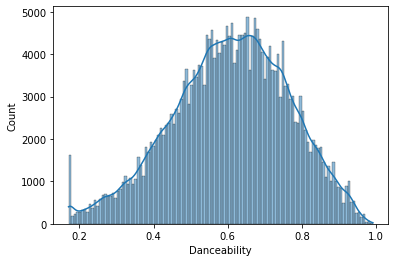

 Min: 0.14606911918622806 Max: 0.6931471805599453 
 mean: 0.4917946511829317 std: 0.13042128487674454 
 median: 0.5164100020598913 
 mode: 0.14606911918622806


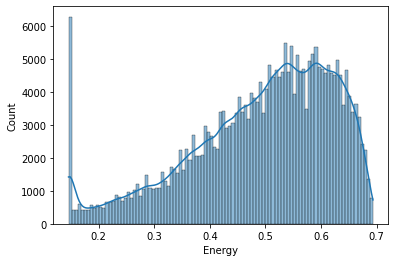

 Min: 0.0 Max: 0.00183 
 mean: 0.00046457250850550876 std: 0.0007521207363057312 
 median: 3.2e-06 
 mode: 0.0


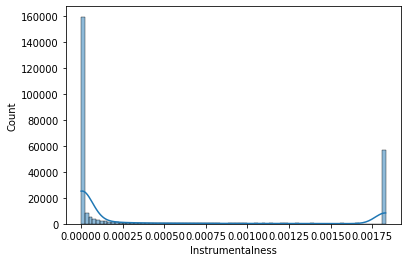

 Min: 0.0 Max: 0.4609 
 mean: 0.17742209006451415 std: 0.1175504635602676 
 median: 0.126 
 mode: 0.4609


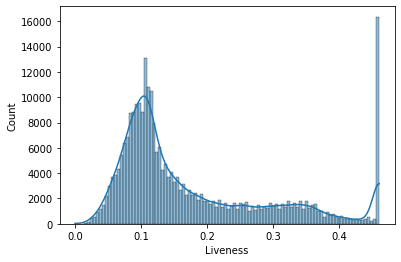

 Min: -14.251875 Max: 0.743125 
 mean: -7.036758441670609 std: 2.972503275073463 
 median: -6.454 
 mode: -14.251875


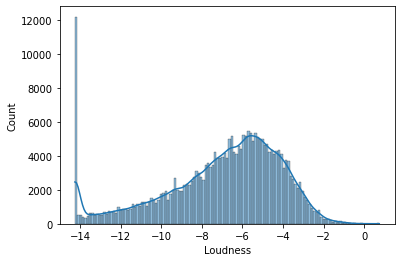

 Min: 0.0 Max: 0.19910000000000003 
 mean: 0.07814747726231513 std: 0.05855825926800997 
 median: 0.0501 
 mode: 0.19910000000000003


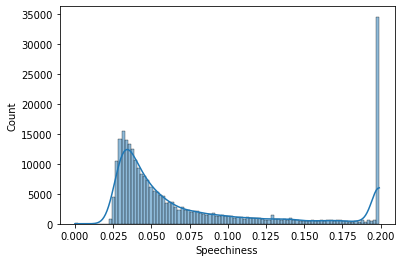

 Min: 4.10330871837021 Max: 5.451381742274873 
 mean: 4.7822378893247395 std: 0.23627820490041218 
 median: 4.800161145882709 
 mode: 4.10330871837021


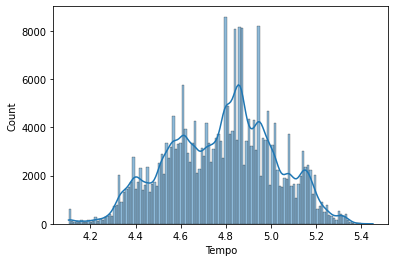

In [53]:
for col in numeric_columns:
    sns.histplot(x = df[col], kde=True)
    print(' Min:', df[col].min(), 'Max:', df[col].max(), '\n mean:', df[col].mean(), 'std:', df[col].std(),'\n', 'median:', df[col].median(), '\n', 'mode:', df[col].mode()[0])
    plt.show() #from outlet 017 and 027 have alot of item weights 12.5

#### b) catgorical variable
* Here categorical is too large uniques so we wont do it wont help in this large data

In [54]:
for col in categorical_columns:
    print(df[col].nunique())

2698
76268
43003
20151


In [55]:
# plt.rcParams['font.size'] = 13

In [56]:
# for col in catgorical_feat[1:]:
#     plt.figure(figsize=(6, 6))
#     plt.title(col)
#     plt.pie(train_data[col].value_counts(),
#            labels=train_data[col].unique(),
#             shadow=True,
#             autopct='%.3f')
#     plt.show()

---

### bivariate Analysis
 * corr matrix then analysis

<AxesSubplot:>

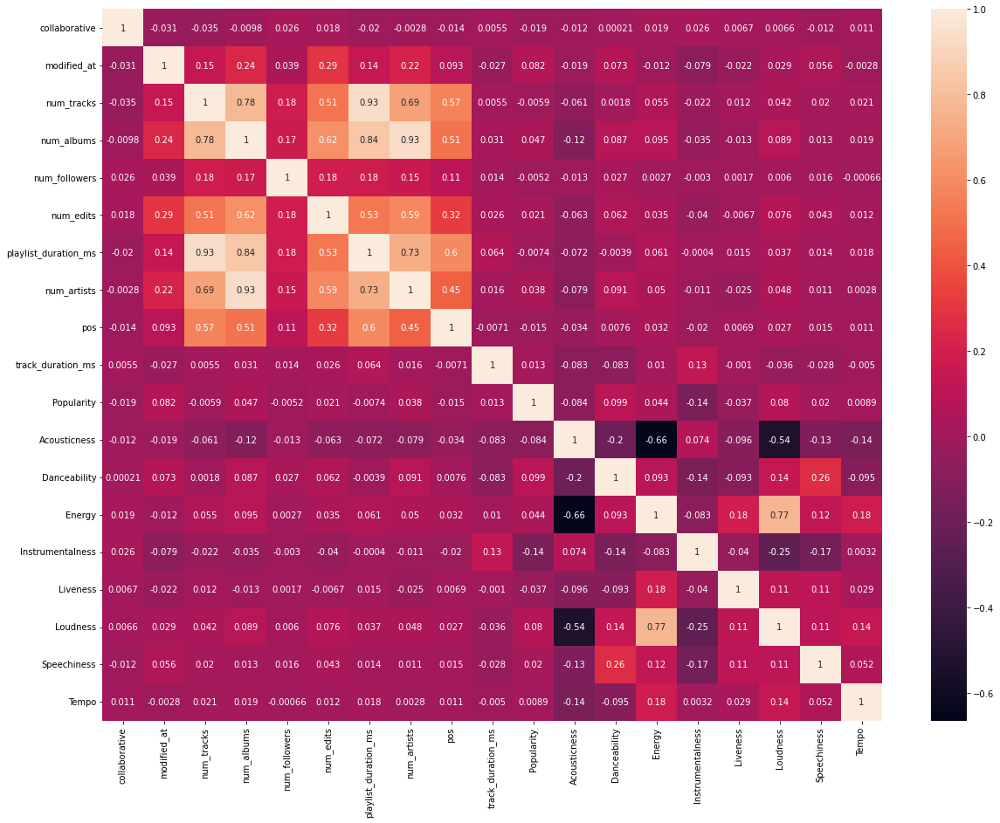

In [57]:
plt.figure(figsize=(20, 15))
corr_matrix = df.corr()
sns.heatmap(corr_matrix, annot=True)

* playlist duration vs number of tracks are highly correlated
* playlist duration vs number of albums are highly correlated
* number of artists vs number of albums are highly correlated

### C) Multivariate Analysis

**just use pairplot**

<Figure size 2160x1800 with 0 Axes>

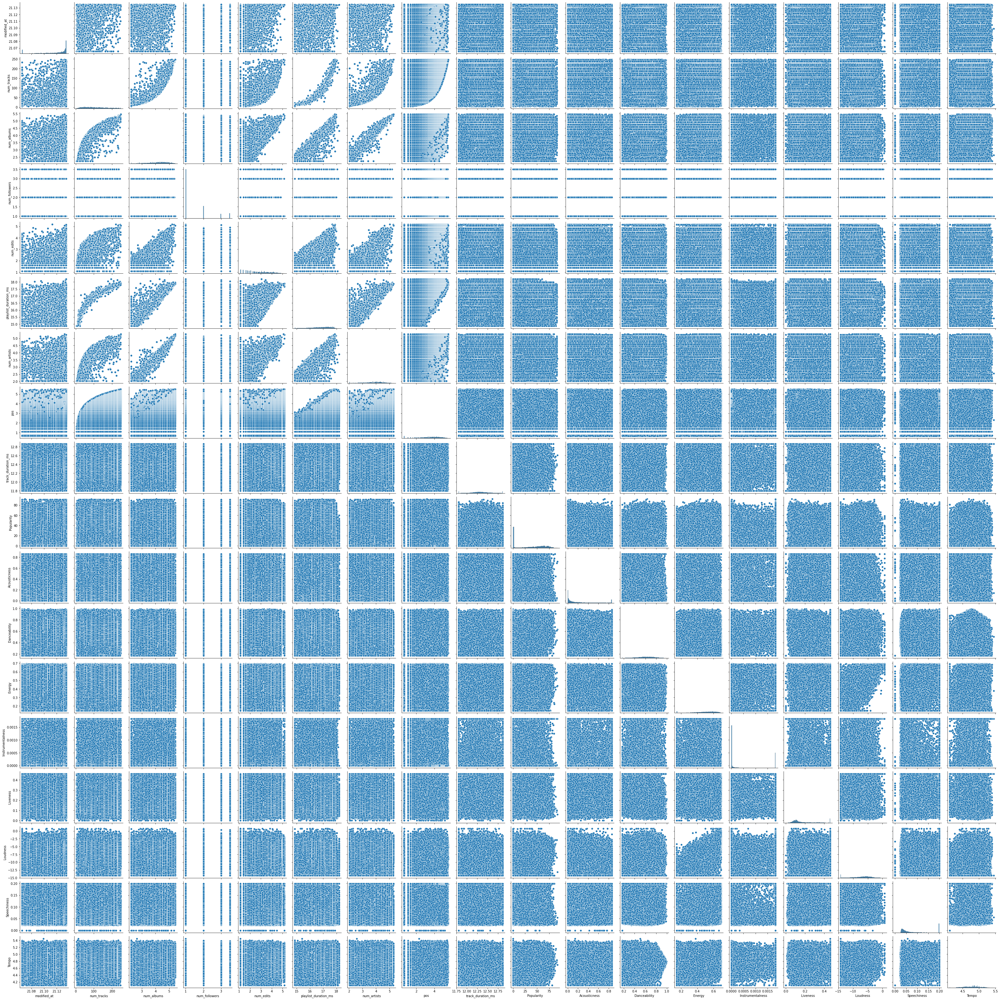

In [58]:
plt.figure(figsize=(30, 25))
sns.pairplot(data=df[numeric_columns])
plt.show()

From pairplot:

Highly correlation are:

(num_tracks, num_albums) **vs** (num_edits, playlist_duration_ms, num_artists) 

In [59]:
df

,name,collaborative,modified_at,num_tracks,num_albums,num_followers,num_edits,playlist_duration_ms,num_artists,pos,...,Popularity,Acousticness,Danceability,Energy,Instrumentalness,Liveness,Loudness,Speechiness,Tempo,parsed_Release_date
0,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,0.652889,...,67,0.03110,0.904,0.594983,0.001830,0.0471,-7.105,0.1210,4.839934,2005-07-04
1,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,0.693147,...,81,0.02490,0.774,0.608678,0.001830,0.2420,-3.914,0.1140,4.970091,2003-11-13
2,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.098612,...,21,0.00238,0.664,0.564177,0.000000,0.0598,-6.583,0.1991,4.607757,2003-06-23
3,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.386294,...,76,0.20100,0.892,0.538830,0.000234,0.0521,-6.055,0.1410,4.624698,2002-11-04
4,Throwbacks,False,21.124337,52,3.871201,1.0,1.945910,16.260672,3.637586,1.609438,...,0,0.05610,0.853,0.473747,0.000000,0.3130,-4.596,0.0713,4.561835,2000-01-01
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
266381,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.532599,...,58,0.02230,0.380,0.430483,0.001830,0.0940,-5.493,0.0313,4.855275,2005-11-11
266382,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.543295,...,61,0.00415,0.401,0.534151,0.000000,0.0916,-7.554,0.0404,5.133849,1995-01-01
266383,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.553877,...,58,0.00192,0.513,0.598837,0.000003,0.4609,-5.428,0.0299,4.614645,2002-02-25
266384,other,False,21.074520,97,4.043051,1.0,2.302585,16.931187,2.890372,4.564348,...,0,0.01310,0.381,0.611937,0.000000,0.3180,-7.123,0.1440,5.273000,2014-10-13


In [60]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 266298 entries, 0 to 266385
Data columns (total 24 columns):
 #   Column                Non-Null Count   Dtype         
---  ------                --------------   -----         
 0   name                  266298 non-null  object        
 1   collaborative         266298 non-null  bool          
 2   modified_at           266298 non-null  float64       
 3   num_tracks            266298 non-null  int64         
 4   num_albums            266298 non-null  float64       
 5   num_followers         266298 non-null  float64       
 6   num_edits             266298 non-null  float64       
 7   playlist_duration_ms  266298 non-null  float64       
 8   num_artists           266298 non-null  float64       
 9   pos                   266298 non-null  float64       
 10  track_name            266298 non-null  object        
 11  album_name            266298 non-null  object        
 12  artist_name           266298 non-null  object        
 13 

In [61]:
# df.to_csv('Cleaned_Data.csv', index=False)